<a href="https://colab.research.google.com/github/UtkarshSinghShrinet001/Pandas-and-NumPy/blob/main/deeeeeffoorrrr.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import files
uploaded = files.upload()


Saving data_set_final.xlsx to data_set_final.xlsx


In [ ]:
import pandas as pd
df = pd.read_excel("data_set_final.xlsx")  # use the uploaded filename

print("✅ File loaded")
print(df.head())


✅ File loaded
         LOCATION      DATES  MIN . TEMPERATURE  MAX. TEMPERATURE   \
0  GREATER NOIDA  1985-01-01                  4                 24   
1  GREATER NOIDA  1985-12-31                  7                 21   
2  GREATER NOIDA  1986-12-31                  7                 21   
3  GREATER NOIDA  1987-12-31                  7                 21   
4  GREATER NOIDA  1988-12-31                  7                 21   

   AVG. TEMPERATURE  AVG. Humidity(%)  \
0              13.0                53   
1              14.0                70   
2              14.0                70   
3              14.0                70   
4              14.0                70   

                                             IMAGES   
0  https://drive.google.com/file/d/1jUGrc4-_Wgvqt...  
1  https://drive.google.com/file/d/1bsHKaKW-PoUlm...  
2  https://drive.google.com/file/d/1FtouecyNNaPkz...  
3  https://drive.google.com/file/d/1a6FBmezSyws_d...  
4  https://drive.google.com/file/d/1HuRBz28

In [ ]:
df.columns = df.columns.str.strip()


In [ ]:
print(df.columns.tolist())


['LOCATION', 'DATES', 'MIN . TEMPERATURE', 'MAX. TEMPERATURE', 'AVG. TEMPERATURE', 'AVG. Humidity(%)', 'IMAGES']


In [ ]:
print(df['IMAGES'].head())  # ✅ works


0    https://drive.google.com/file/d/1jUGrc4-_Wgvqt...
1    https://drive.google.com/file/d/1bsHKaKW-PoUlm...
2    https://drive.google.com/file/d/1FtouecyNNaPkz...
3    https://drive.google.com/file/d/1a6FBmezSyws_d...
4    https://drive.google.com/file/d/1HuRBz284q6sSl...
Name: IMAGES, dtype: object


✅ Converted Drive links to direct download format
                                              IMAGES  \
0  https://drive.google.com/file/d/1jUGrc4-_Wgvqt...   
1  https://drive.google.com/file/d/1bsHKaKW-PoUlm...   
2  https://drive.google.com/file/d/1FtouecyNNaPkz...   
3  https://drive.google.com/file/d/1a6FBmezSyws_d...   
4  https://drive.google.com/file/d/1HuRBz284q6sSl...   

                                         DIRECT_LINK  
0  https://drive.google.com/uc?export=download&id...  
1  https://drive.google.com/uc?export=download&id...  
2  https://drive.google.com/uc?export=download&id...  
3  https://drive.google.com/uc?export=download&id...  
4  https://drive.google.com/uc?export=download&id...  
📌 Processing First Image: https://drive.google.com/uc?export=download&id=1jUGrc4-_WgvqtvfCEjv8lnJlH99kXGHh
✅ First image resized & scaled


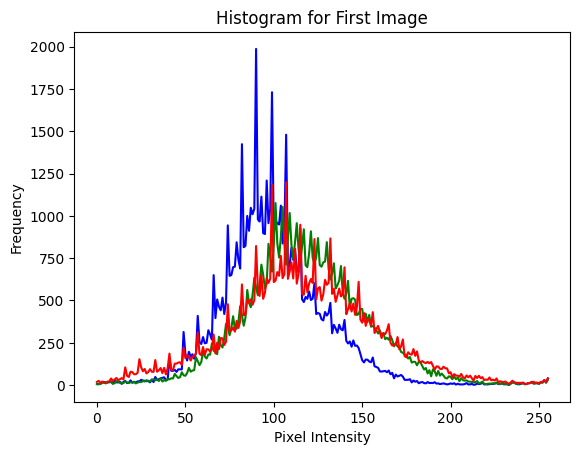

In [ ]:
# successful for first data.
import requests
import numpy as np
import cv2
import matplotlib.pyplot as plt

# ✅ STEP 2: Convert Drive Links → Direct Download
def gdrive_to_direct(url):
    """Convert Google Drive share link to direct download link"""
    if "drive.google.com/file/d/" in url:
        file_id = url.split("/d/")[1].split("/")[0]
        return f"https://drive.google.com/uc?export=download&id={file_id}"
    return url

df['DIRECT_LINK'] = df['IMAGES'].apply(gdrive_to_direct)

print("✅ Converted Drive links to direct download format")
print(df[['IMAGES', 'DIRECT_LINK']].head())  # preview first 5 links


# ✅ STEP 3: Function to download + load image
def load_image_from_gdrive(url):
    """Download image from Google Drive and load with OpenCV"""
    try:
        response = requests.get(url, stream=True)
        if response.status_code != 200:
            print(f"⚠️ Failed to fetch: {url}")
            return None
        img_array = np.asarray(bytearray(response.content), dtype=np.uint8)
        return cv2.imdecode(img_array, cv2.IMREAD_COLOR)
    except Exception as e:
        print(f"❌ Error fetching image: {e}")
        return None


# ✅ STEP 4: Resize, Scale, and Plot Histogram
def resize_image(img, size=(256, 256)):
    return cv2.resize(img, size)

def scale_image(img):
    return img / 255.0

def plot_histogram(img, title="Color Histogram"):
    colors = ('b', 'g', 'r')
    plt.figure()
    for i, col in enumerate(colors):
        hist = cv2.calcHist([img], [i], None, [256], [0, 256])
        plt.plot(hist, color=col)
    plt.title(title)
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.show()


# ✅ STEP 5: Run for first image (test)
first_url = df['DIRECT_LINK'].iloc[0]
print("📌 Processing First Image:", first_url)

img = load_image_from_gdrive(first_url)
if img is not None:
    img_resized = resize_image(img)
    img_scaled = scale_image(img_resized)
    print("✅ First image resized & scaled")
    plot_histogram(img_resized, title="Histogram for First Image")
else:
    print("❌ Could not process first image")


In [ ]:
def gdrive_to_direct(url):
    if "drive.google.com" in url and "file/d/" in url:
        file_id = url.split("file/d/")[1].split("/")[0]
        return f"https://drive.google.com/uc?id={file_id}"
    return url


In [ ]:
def calculate_green_density(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    lower_green = np.array([35, 40, 40])
    upper_green = np.array([85, 255, 255])
    mask = cv2.inRange(hsv, lower_green, upper_green)

    green_pixels = cv2.countNonZero(mask)
    total_pixels = img.shape[0] * img.shape[1]

    return (green_pixels / total_pixels) * 100



📌 Processing Image 1: https://drive.google.com/file/d/1jUGrc4-_WgvqtvfCEjv8lnJlH99kXGHh/view?usp=sharing
🌿 Green Density for Image 1: 19.57%


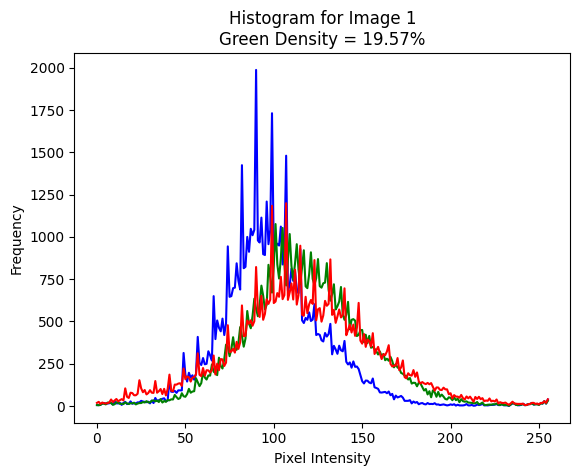


📌 Processing Image 2: https://drive.google.com/file/d/1bsHKaKW-PoUlmhbfd5D59mgtZGzdi1fv/view?usp=sharing
🌿 Green Density for Image 2: 13.43%


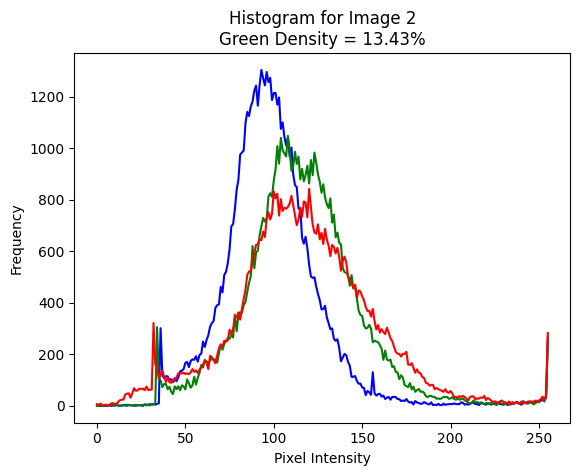


📌 Processing Image 3: https://drive.google.com/file/d/1FtouecyNNaPkzh_1UefLt7iA9t6BcIxn/view?usp=sharing
🌿 Green Density for Image 3: 15.36%


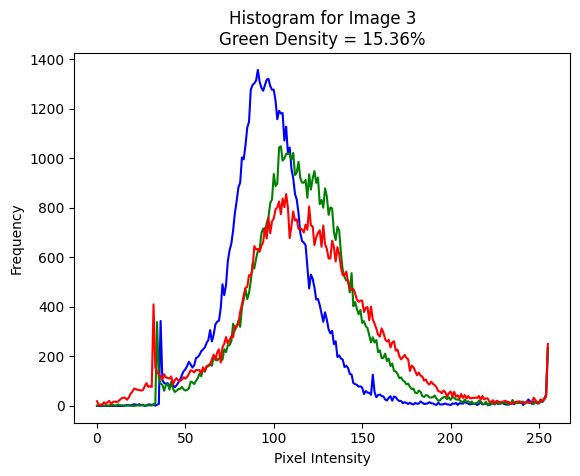


📌 Processing Image 4: https://drive.google.com/file/d/1a6FBmezSyws_d8kv7bGb3XY1fdRwXO32/view?usp=sharing
🌿 Green Density for Image 4: 15.35%


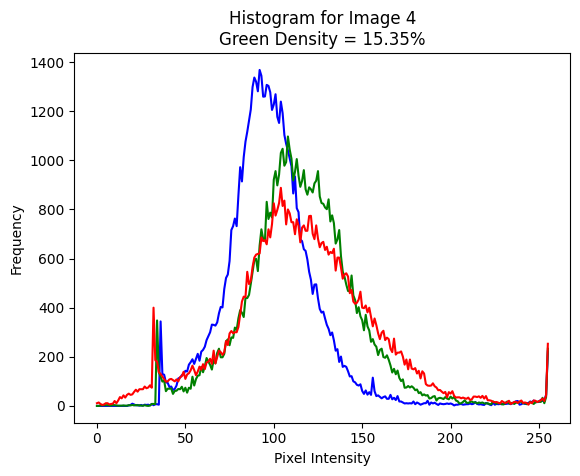


📌 Processing Image 5: https://drive.google.com/file/d/1HuRBz284q6sSlrRoqfD2f1wWW3D4nNwM/view?usp=sharing
🌿 Green Density for Image 5: 15.38%


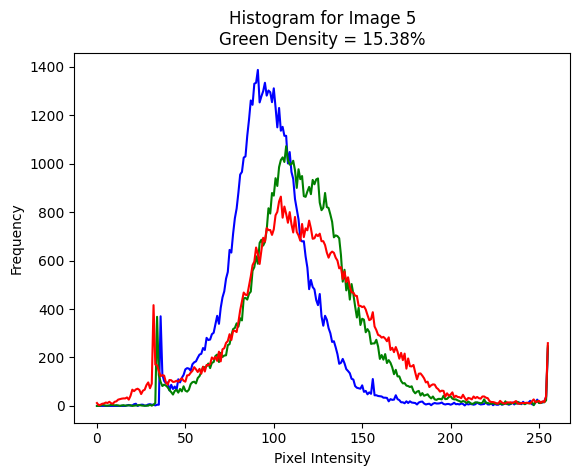

In [ ]:
import cv2
import matplotlib.pyplot as plt
import requests
import numpy as np
from io import BytesIO
from PIL import Image

# Convert Google Drive link
def gdrive_to_direct(url):
    if "drive.google.com" in url and "file/d/" in url:
        file_id = url.split("file/d/")[1].split("/")[0]
        return f"https://drive.google.com/uc?id={file_id}"
    return url

# Load image from link
def load_image_from_gdrive(url):
    try:
        response = requests.get(url, stream=True)
        response.raise_for_status()
        img = Image.open(BytesIO(response.content)).convert("RGB")
        return cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    except Exception as e:
        print(f"⚠️ Could not load {url} — {e}")
        return None

# Resize
def resize_image(img, size=(256, 256)):
    return cv2.resize(img, size)

# Normalize
def scale_image(img):
    return img / 255.0

# Green density
def calculate_green_density(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    lower_green = np.array([35, 40, 40])
    upper_green = np.array([85, 255, 255])
    mask = cv2.inRange(hsv, lower_green, upper_green)
    green_pixels = cv2.countNonZero(mask)
    total_pixels = img.shape[0] * img.shape[1]
    return (green_pixels / total_pixels) * 100

# Histogram
def plot_histogram(img, green_density, title="Color Histogram"):
    color = ('b', 'g', 'r')
    plt.figure()
    for i, col in enumerate(color):
        hist = cv2.calcHist([img], [i], None, [256], [0, 256])
        plt.plot(hist, color=col)
    plt.title(f"{title}\nGreen Density = {green_density:.2f}%")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.show()

# Run for all images
for i, url in enumerate(df['IMAGES'][:5]):  # change [:5] → [:] for all
    print(f"\n📌 Processing Image {i+1}: {url}")

    direct_url = gdrive_to_direct(url)
    img = load_image_from_gdrive(direct_url)

    if img is not None:
        img_resized = resize_image(img)
        img_scaled = scale_image(img_resized)

        green_density = calculate_green_density(img_resized)
        print(f"🌿 Green Density for Image {i+1}: {green_density:.2f}%")

        plot_histogram(img_resized, green_density, title=f"Histogram for Image {i+1}")
    else:
        print(f"❌ Skipped Image {i+1}")



📌 Processing Image 1/209
🌿 Green Density: 19.57%


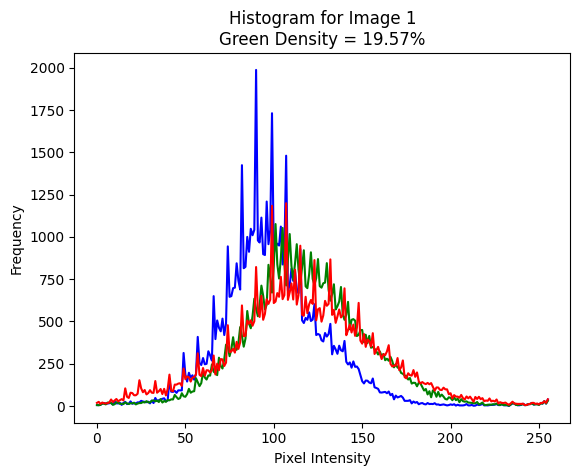


📌 Processing Image 2/209
🌿 Green Density: 13.43%


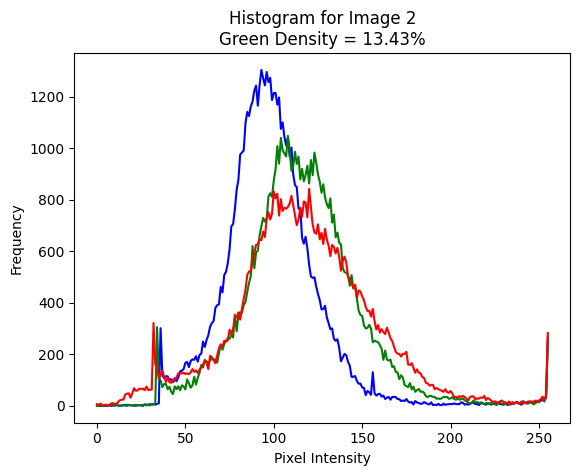


📌 Processing Image 3/209
🌿 Green Density: 15.36%


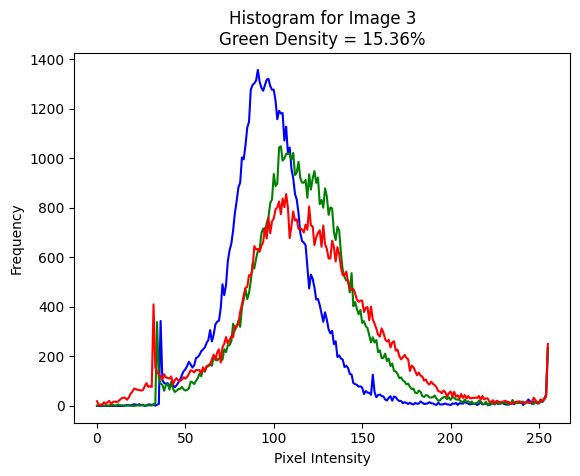


📌 Processing Image 4/209
🌿 Green Density: 15.35%


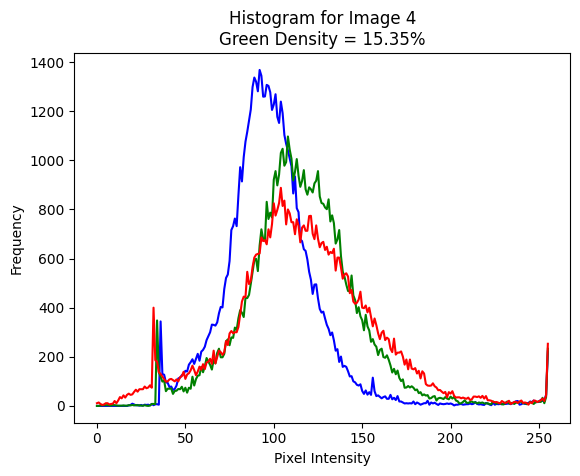


📌 Processing Image 5/209
🌿 Green Density: 15.38%


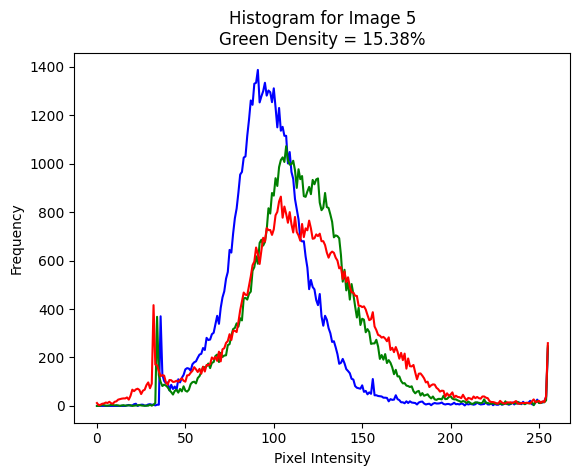


📌 Processing Image 6/209
🌿 Green Density: 15.65%


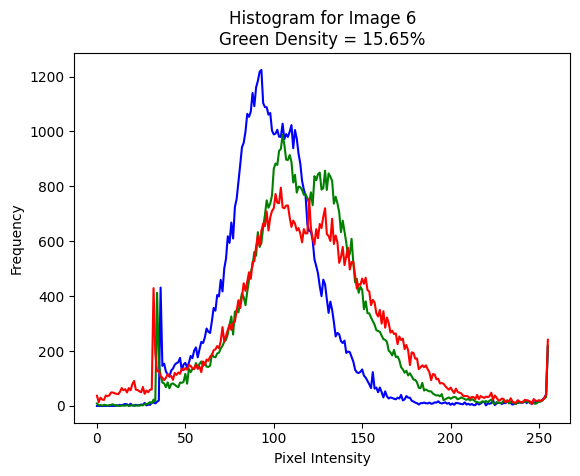


📌 Processing Image 7/209
🌿 Green Density: 15.44%


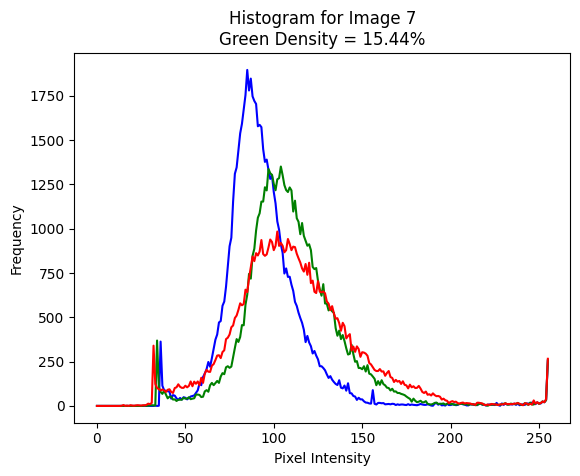


📌 Processing Image 8/209
🌿 Green Density: 14.57%


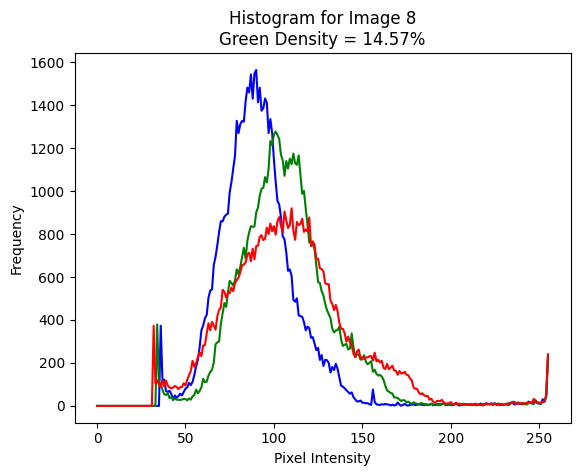


📌 Processing Image 9/209
🌿 Green Density: 26.28%


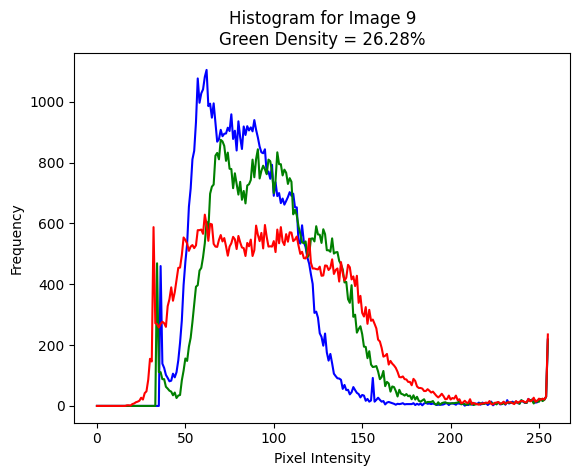


📌 Processing Image 10/209
🌿 Green Density: 22.18%


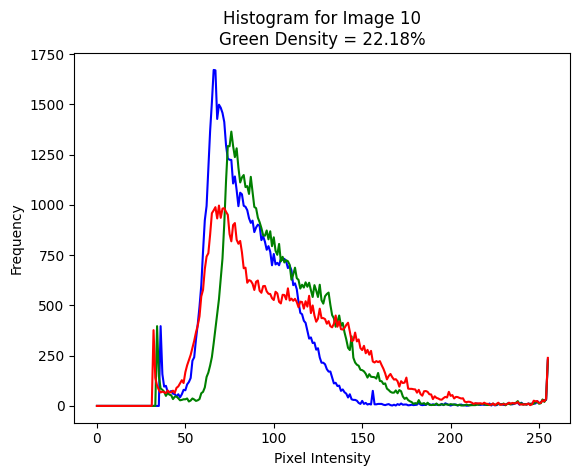


📌 Processing Image 11/209
🌿 Green Density: 22.18%


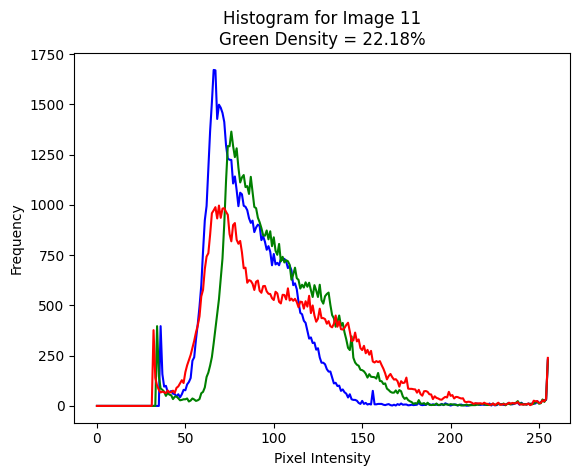


📌 Processing Image 12/209
🌿 Green Density: 15.14%


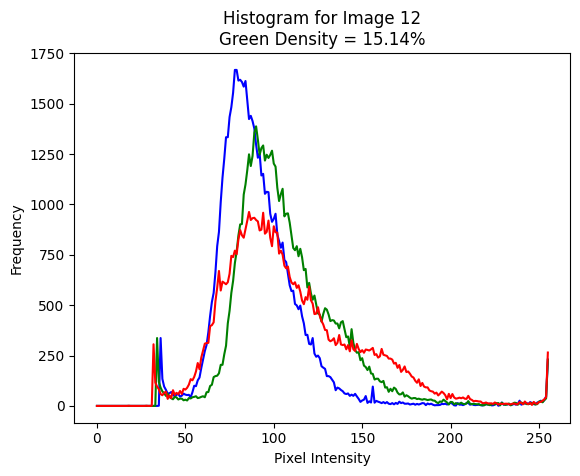


📌 Processing Image 13/209
🌿 Green Density: 25.18%


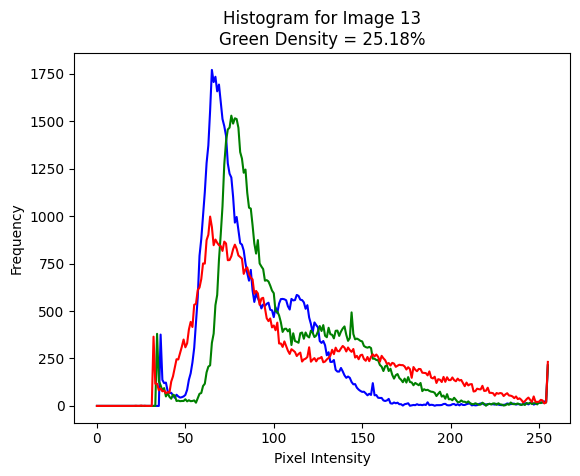


📌 Processing Image 14/209
🌿 Green Density: 33.36%


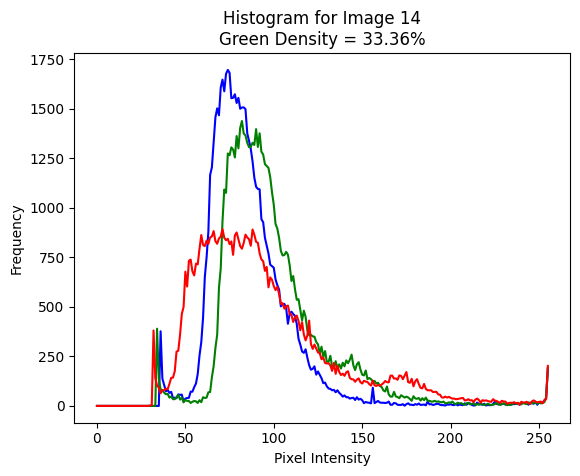


📌 Processing Image 15/209
🌿 Green Density: 37.88%


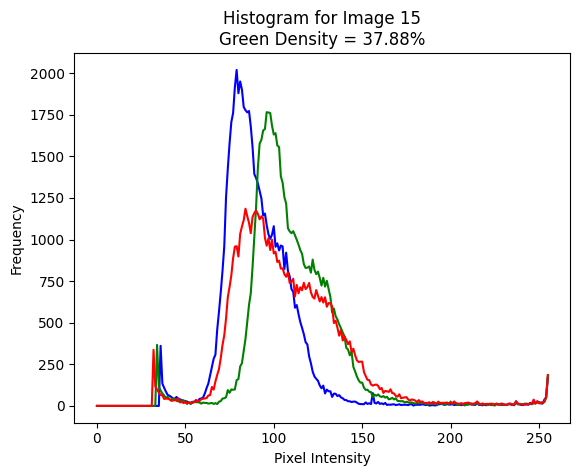


📌 Processing Image 16/209
🌿 Green Density: 33.35%


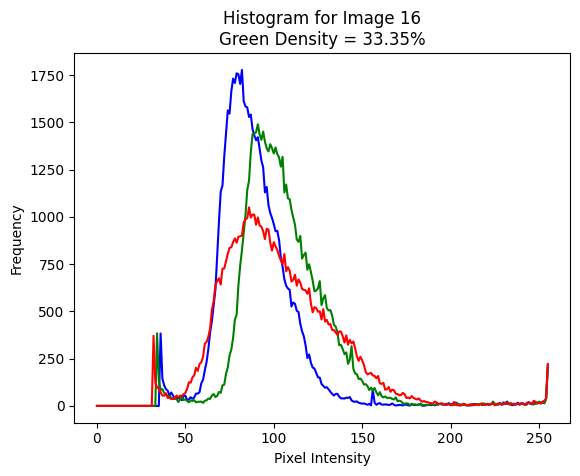


📌 Processing Image 17/209
🌿 Green Density: 32.56%


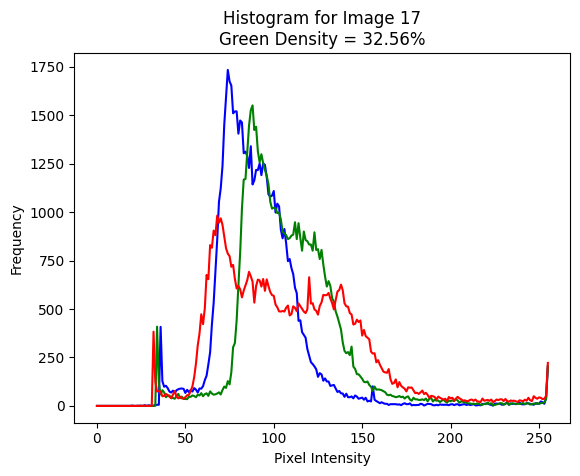


📌 Processing Image 18/209
🌿 Green Density: 28.36%


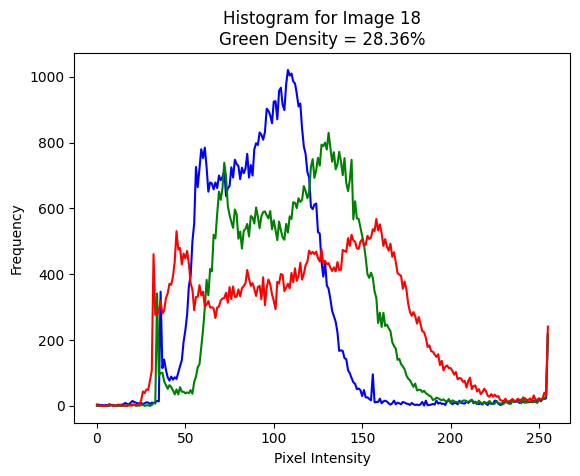


📌 Processing Image 19/209
🌿 Green Density: 29.22%


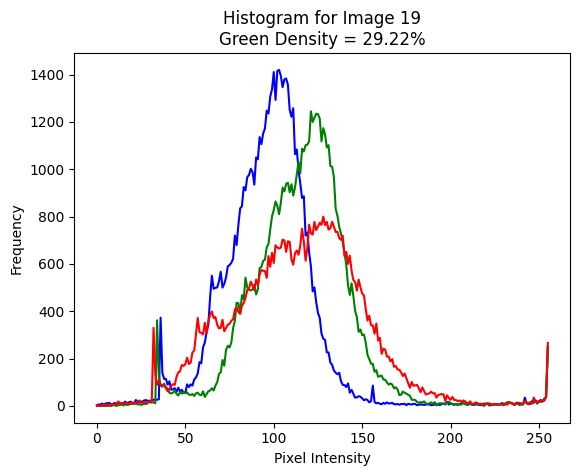


📌 Processing Image 20/209
🌿 Green Density: 18.58%


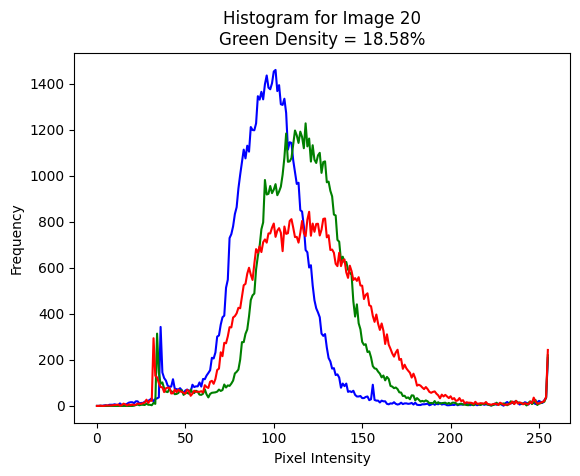


📌 Processing Image 21/209
🌿 Green Density: 23.45%


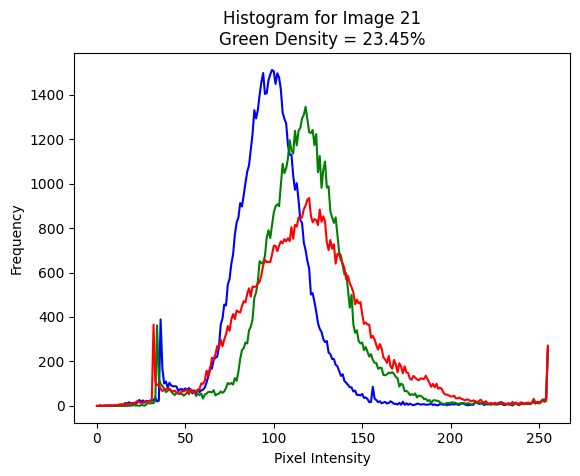


📌 Processing Image 22/209
🌿 Green Density: 17.68%


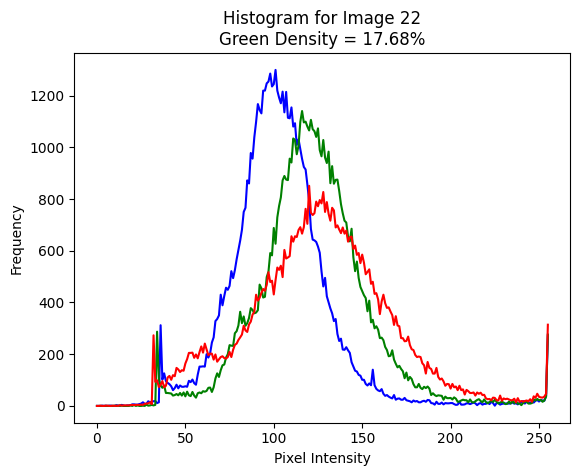


📌 Processing Image 23/209
🌿 Green Density: 15.79%


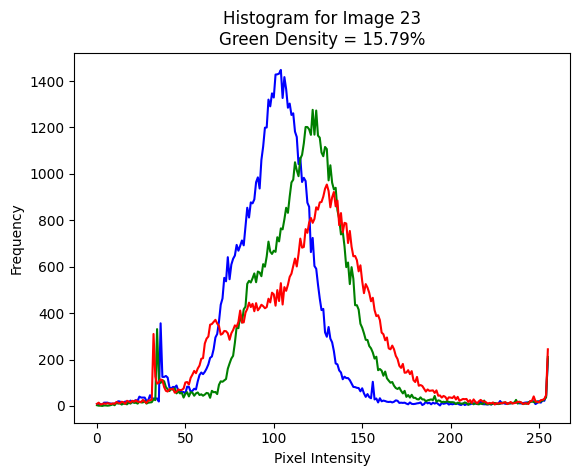


📌 Processing Image 24/209
🌿 Green Density: 15.79%


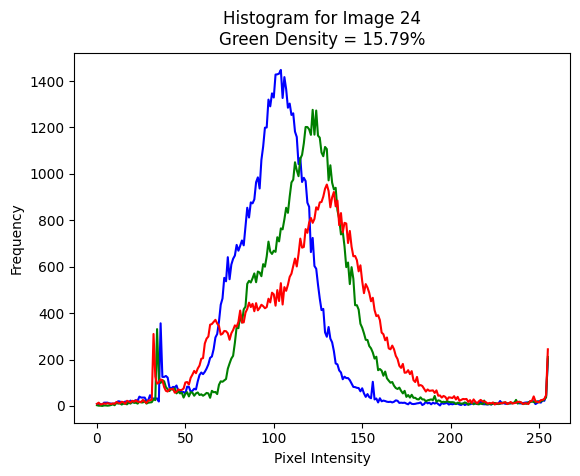


📌 Processing Image 25/209
🌿 Green Density: 32.31%


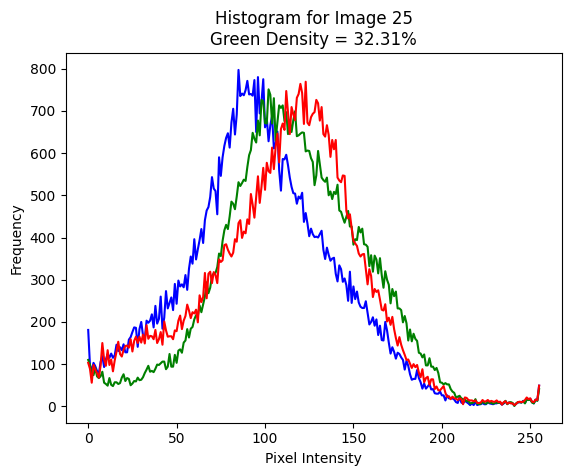


📌 Processing Image 26/209
🌿 Green Density: 50.57%


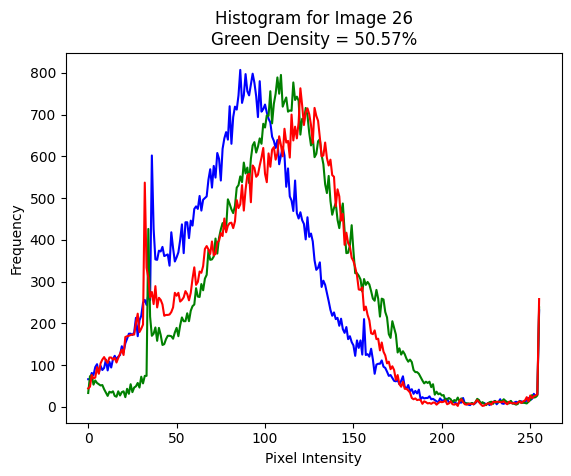


📌 Processing Image 27/209
🌿 Green Density: 9.70%


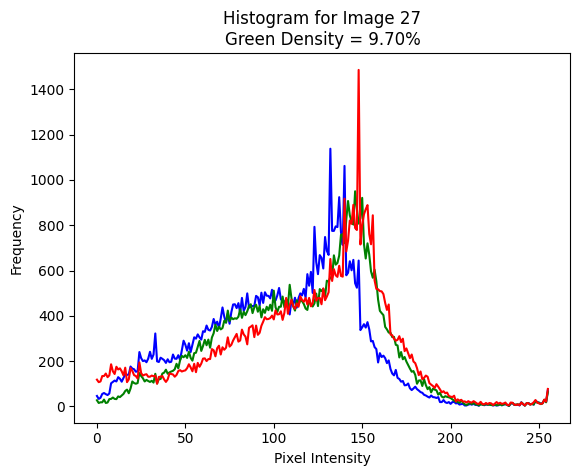


📌 Processing Image 28/209
🌿 Green Density: 37.63%


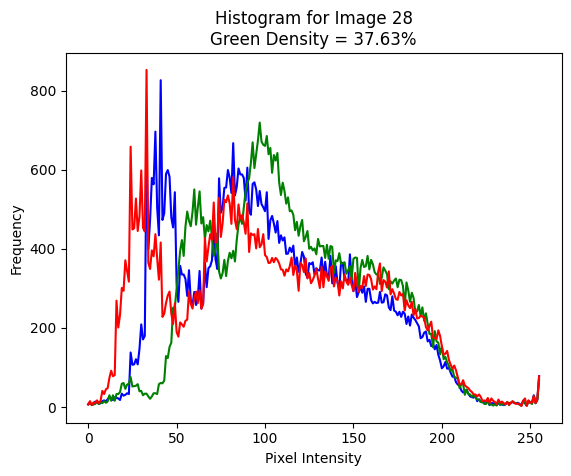


📌 Processing Image 29/209
🌿 Green Density: 37.63%


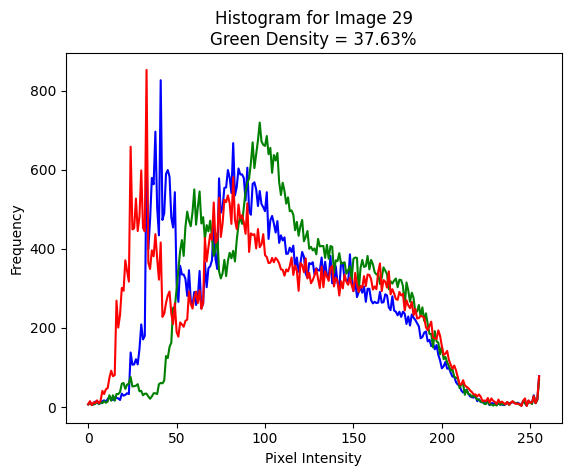


📌 Processing Image 30/209
🌿 Green Density: 30.35%


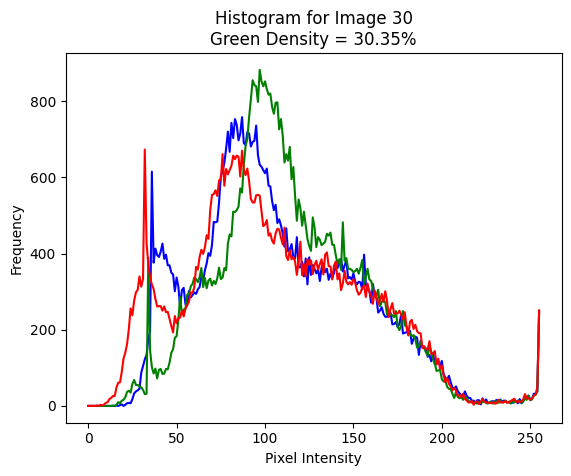


📌 Processing Image 31/209
🌿 Green Density: 10.79%


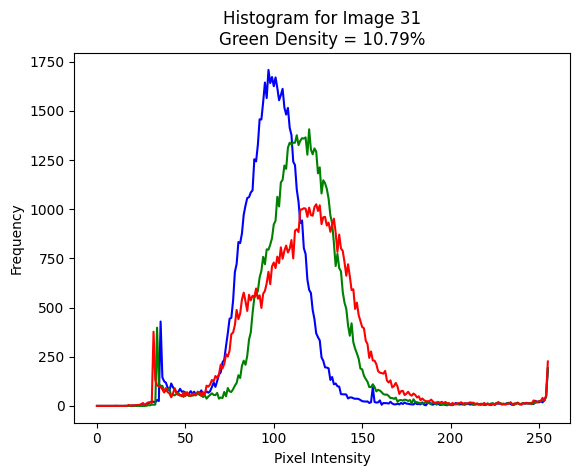


📌 Processing Image 32/209
🌿 Green Density: 17.95%


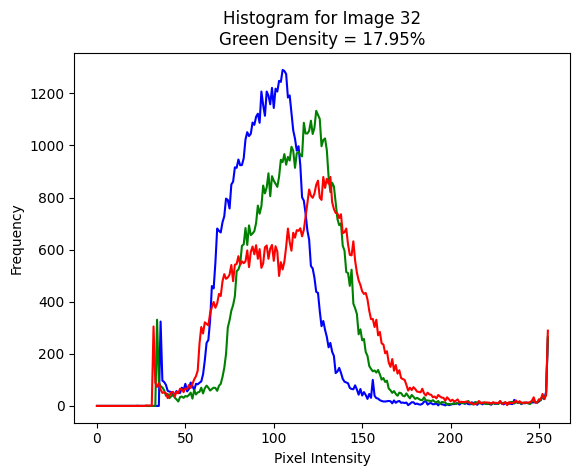


📌 Processing Image 33/209
🌿 Green Density: 16.23%


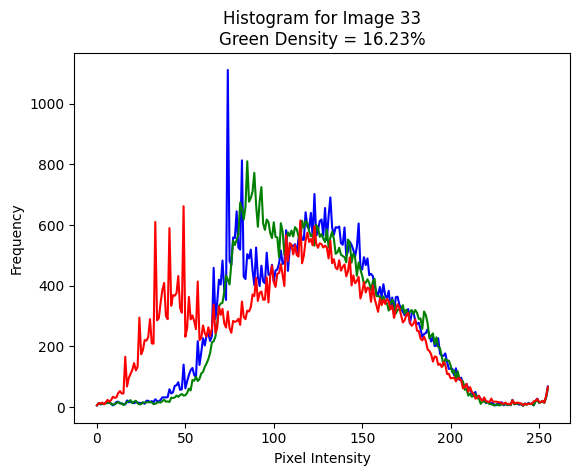


📌 Processing Image 34/209
🌿 Green Density: 30.58%


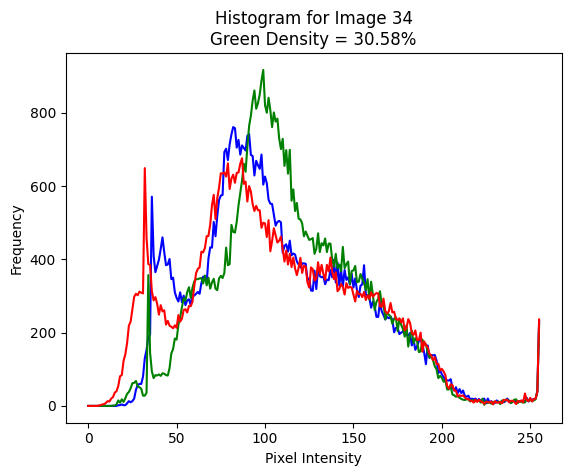


📌 Processing Image 35/209
🌿 Green Density: 5.80%


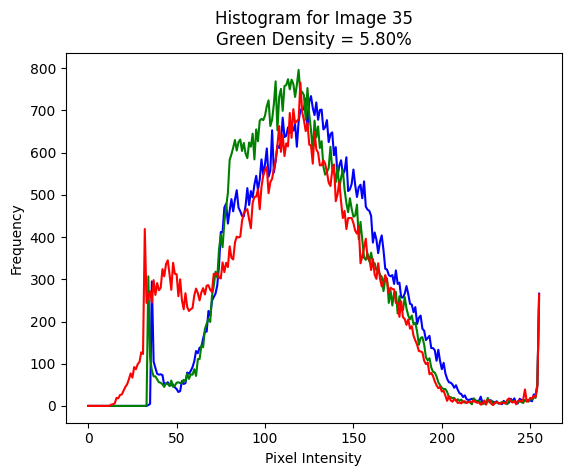


📌 Processing Image 36/209
🌿 Green Density: 16.41%


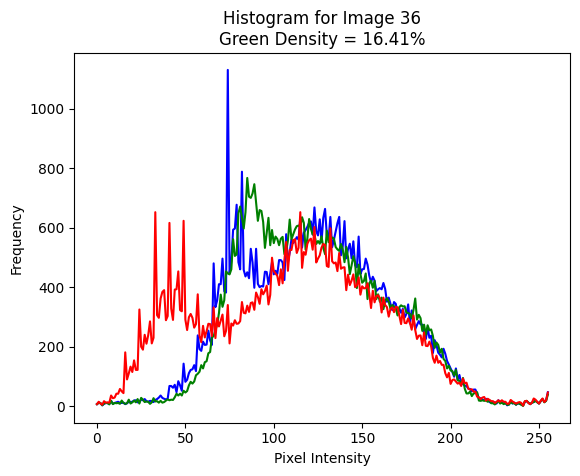


📌 Processing Image 37/209
🌿 Green Density: 5.59%


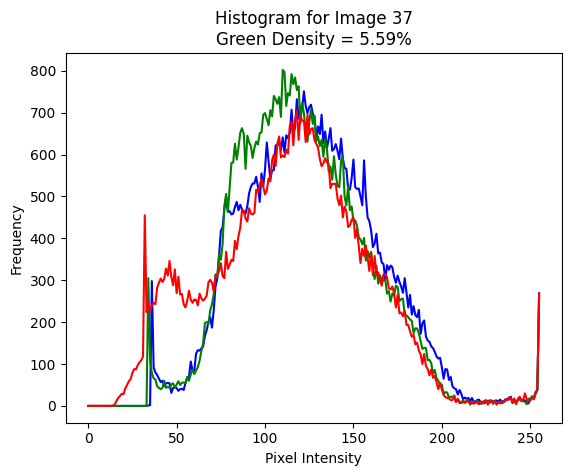


📌 Processing Image 38/209
🌿 Green Density: 13.45%


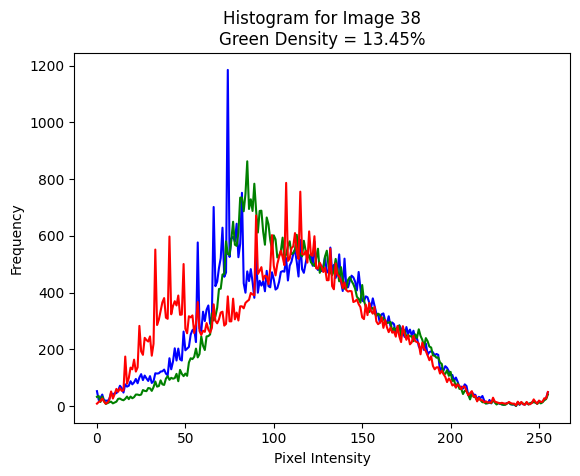


📌 Processing Image 39/209
🌿 Green Density: 5.81%


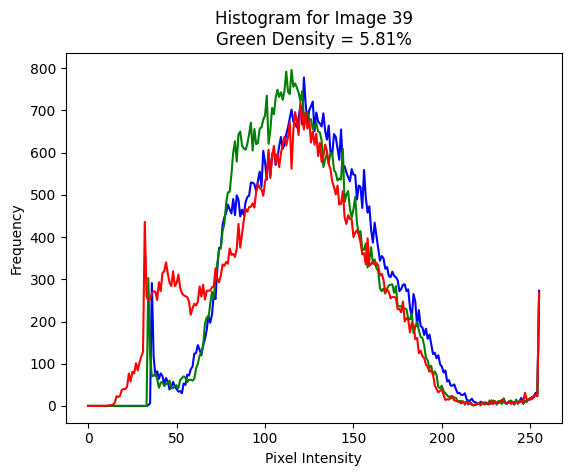


📌 Processing Image 40/209
🌿 Green Density: 19.19%


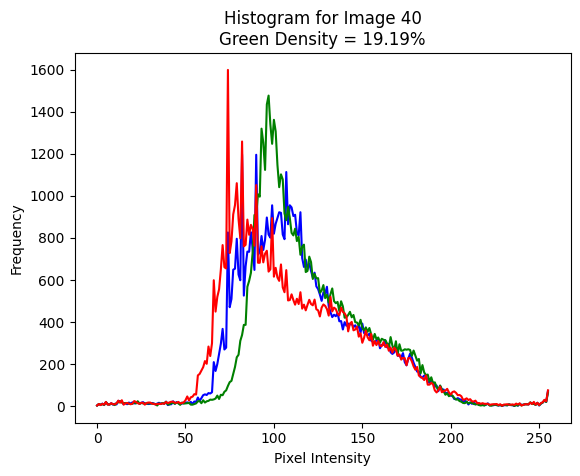


📌 Processing Image 41/209
🌿 Green Density: 9.92%


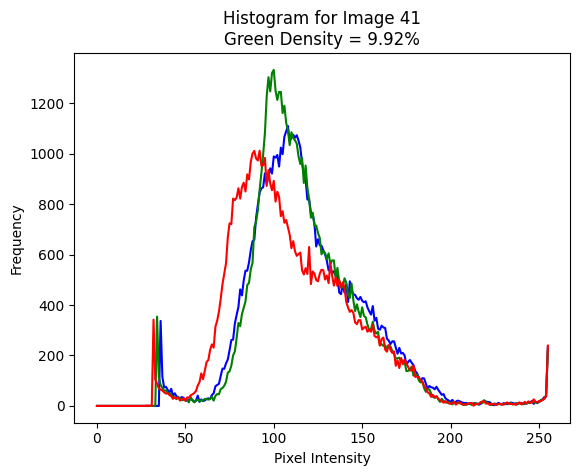


📌 Processing Image 42/209
🌿 Green Density: 1.91%


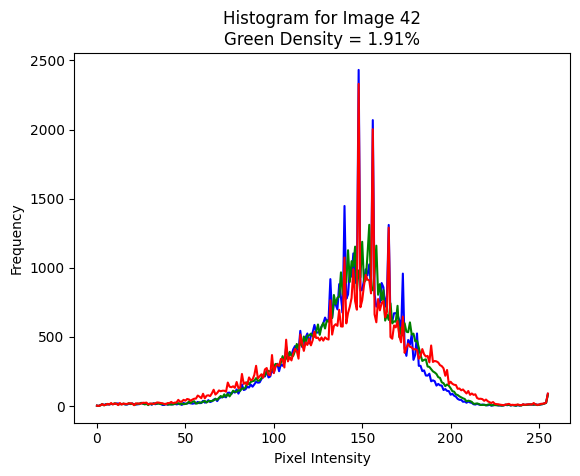


📌 Processing Image 43/209
🌿 Green Density: 1.11%


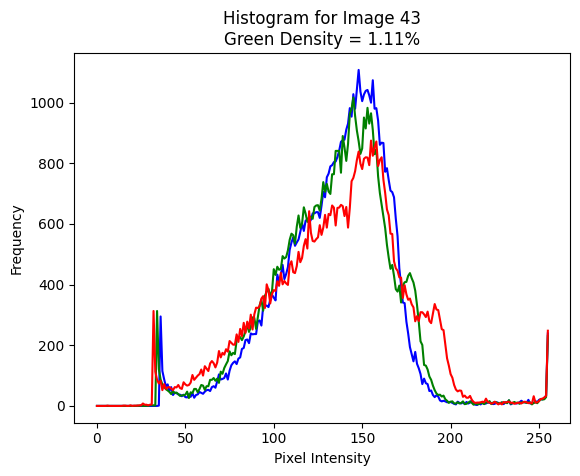


📌 Processing Image 44/209
🌿 Green Density: 1.08%


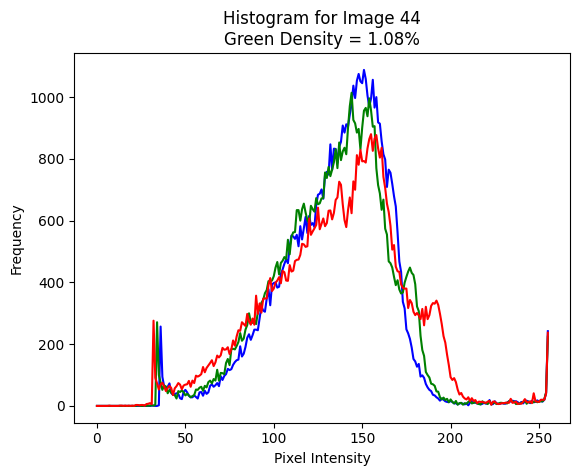


📌 Processing Image 45/209
🌿 Green Density: 4.76%


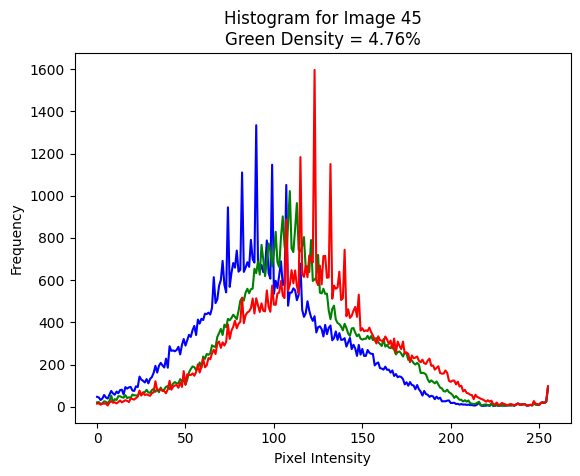


📌 Processing Image 46/209
🌿 Green Density: 3.74%


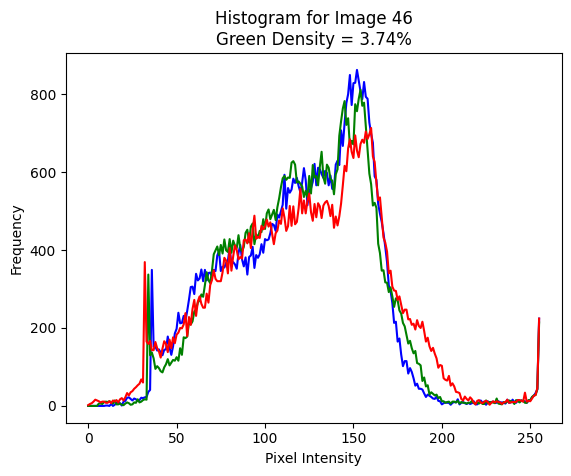


📌 Processing Image 47/209
🌿 Green Density: 3.74%


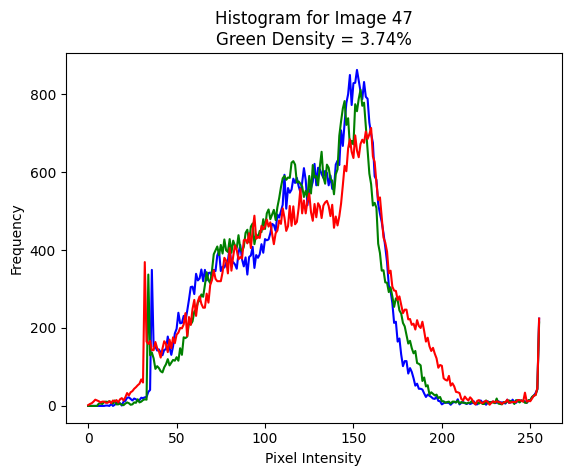


📌 Processing Image 48/209
🌿 Green Density: 16.43%


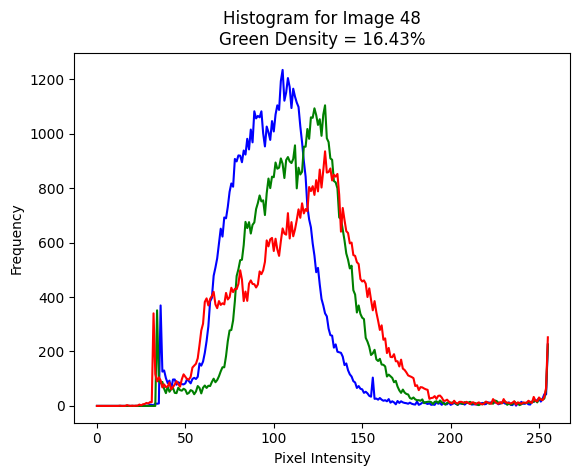


📌 Processing Image 49/209
🌿 Green Density: 3.93%


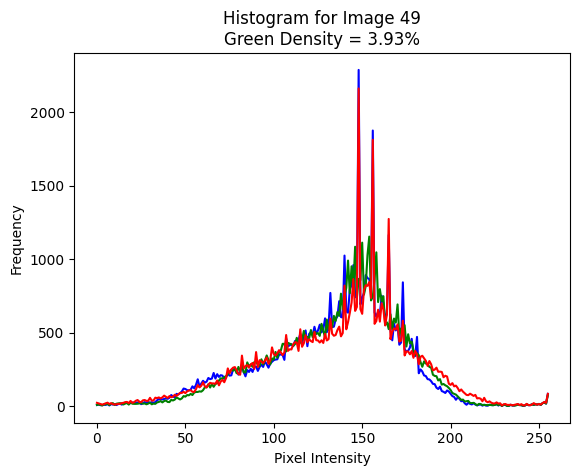


📌 Processing Image 50/209
🌿 Green Density: 19.53%


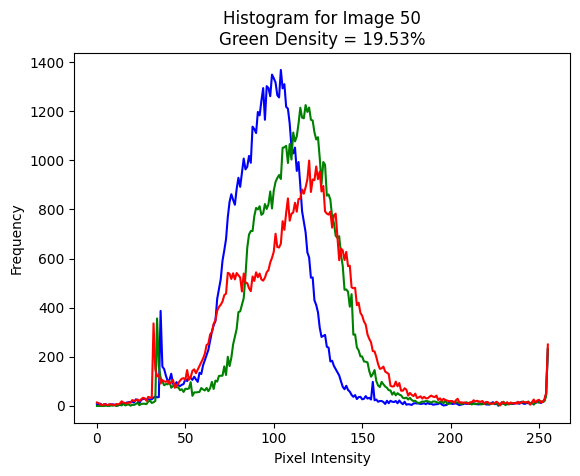


📌 Processing Image 51/209
🌿 Green Density: 19.53%


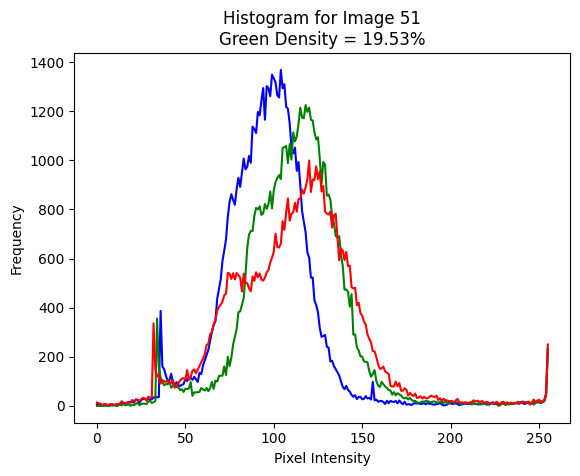


📌 Processing Image 52/209
🌿 Green Density: 4.51%


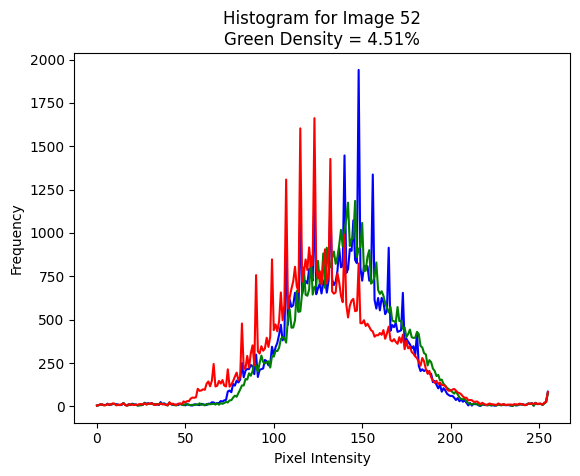


📌 Processing Image 53/209
🌿 Green Density: 3.84%


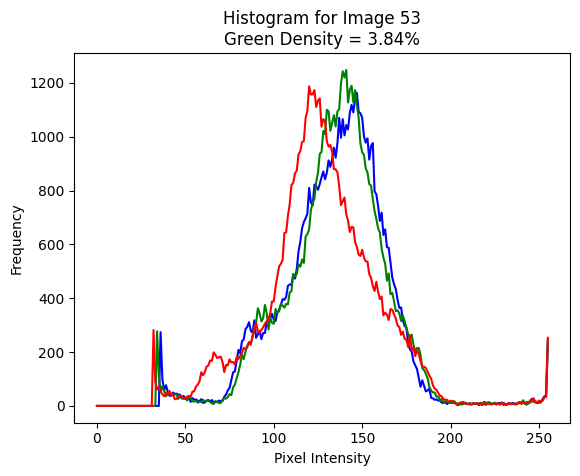


📌 Processing Image 54/209
🌿 Green Density: 1.51%


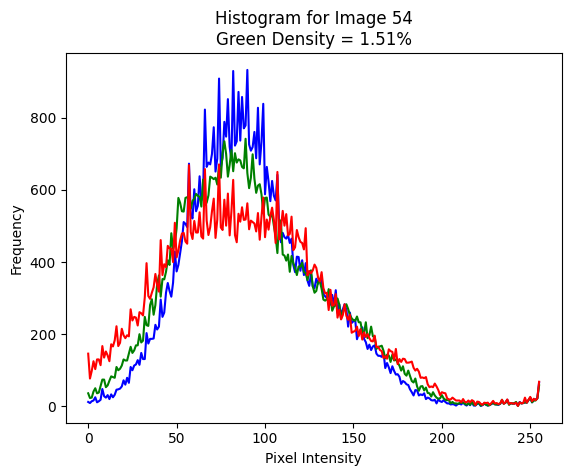


📌 Processing Image 55/209
🌿 Green Density: 0.15%


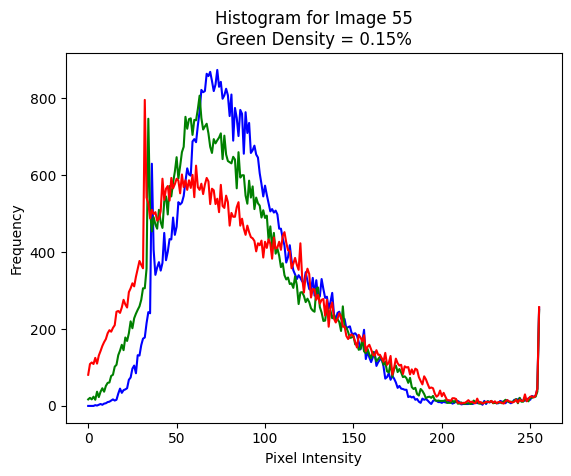


📌 Processing Image 56/209
🌿 Green Density: 14.07%


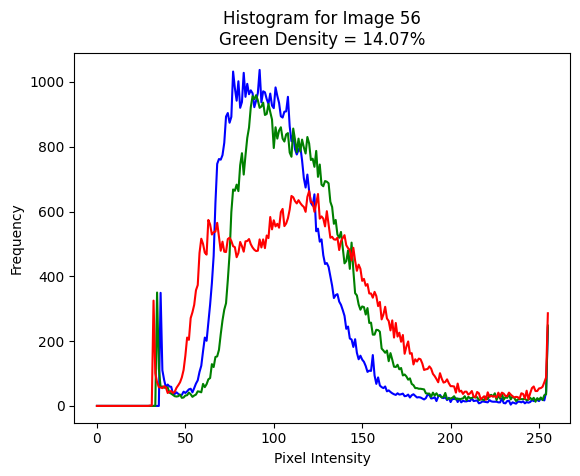


📌 Processing Image 57/209
🌿 Green Density: 0.32%


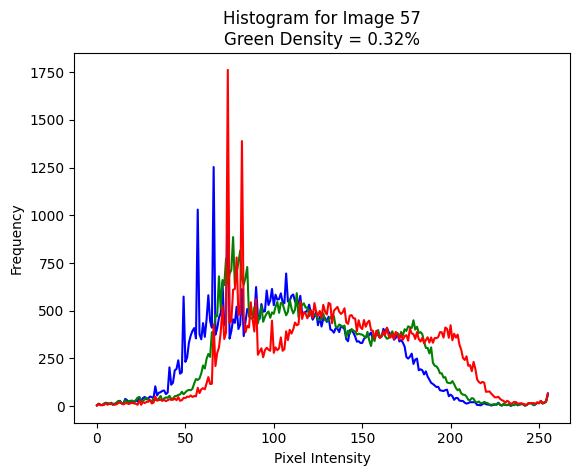


📌 Processing Image 58/209
🌿 Green Density: 0.00%


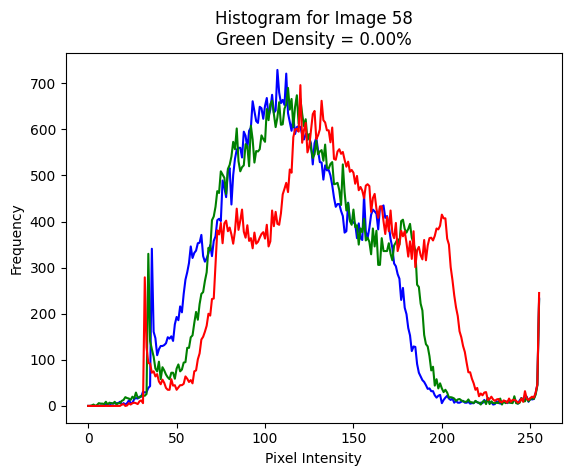


📌 Processing Image 59/209
🌿 Green Density: 0.26%


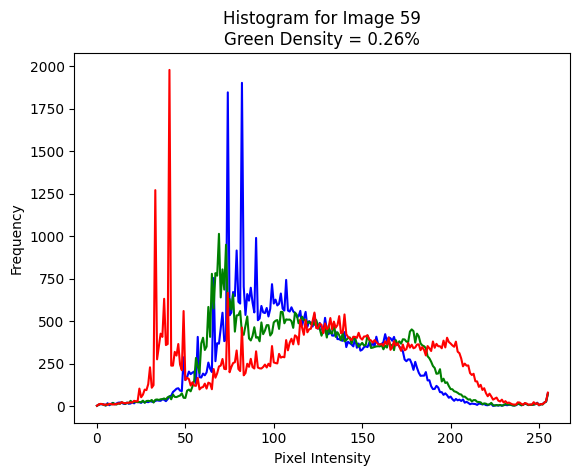


📌 Processing Image 60/209
🌿 Green Density: 0.03%


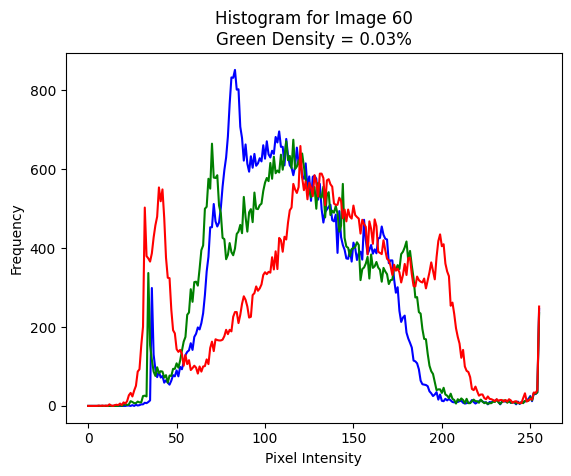


📌 Processing Image 61/209
🌿 Green Density: 0.29%


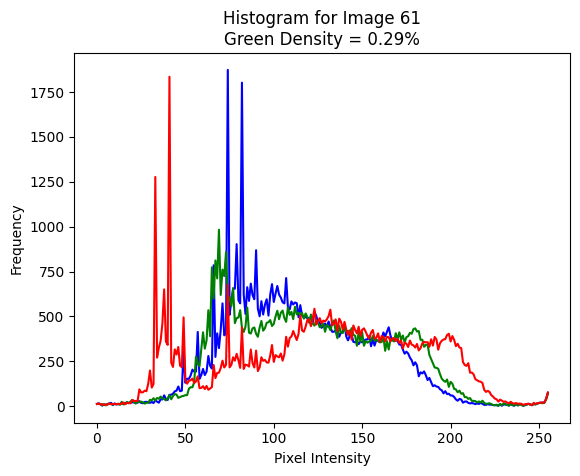


📌 Processing Image 62/209
🌿 Green Density: 0.02%


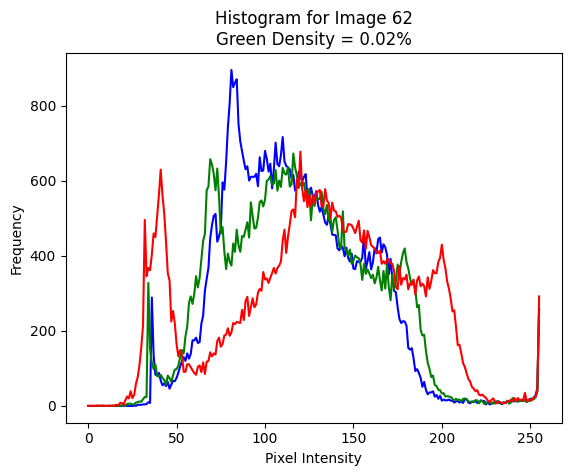


📌 Processing Image 63/209
🌿 Green Density: 0.32%


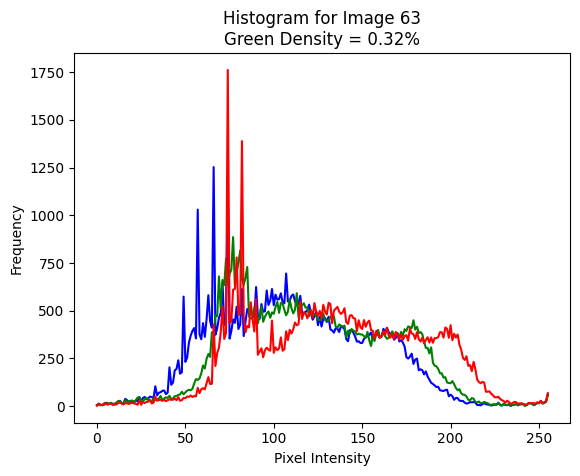


📌 Processing Image 64/209
🌿 Green Density: 12.88%


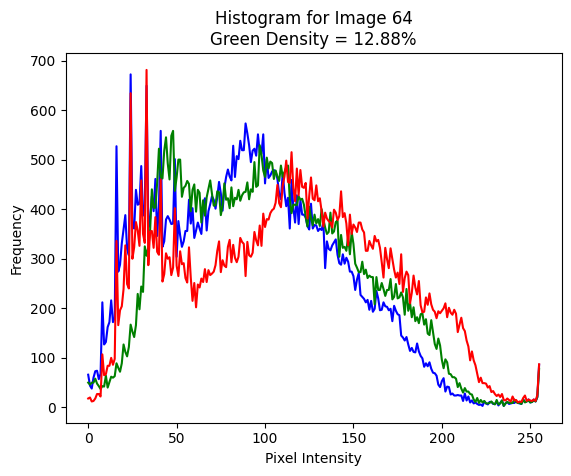


📌 Processing Image 65/209
🌿 Green Density: 8.01%


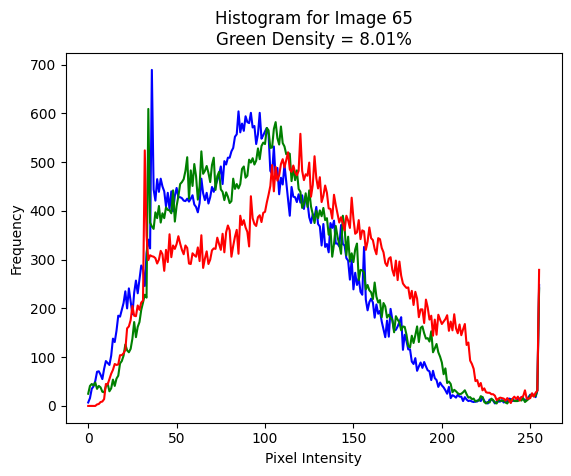


📌 Processing Image 66/209
🌿 Green Density: 0.23%


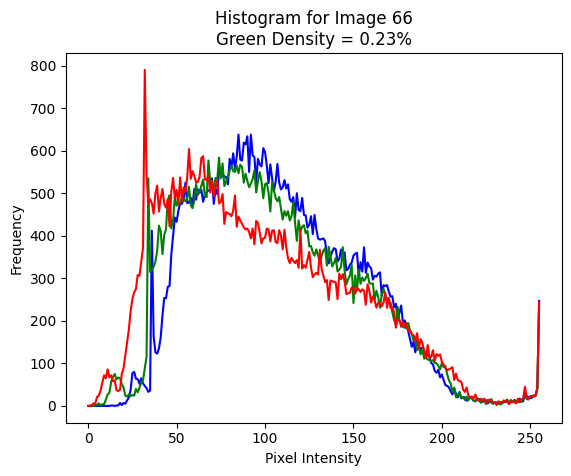


📌 Processing Image 67/209
🌿 Green Density: 0.23%


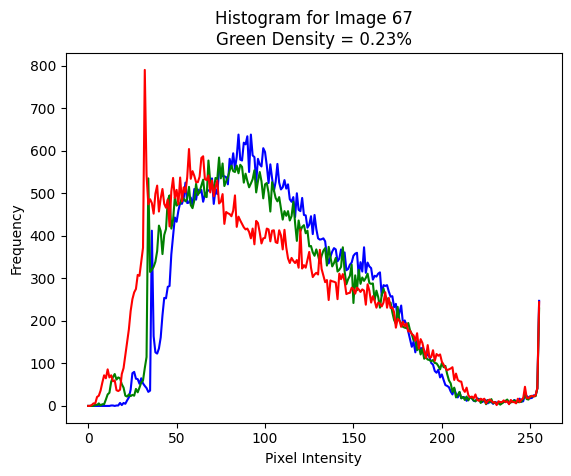


📌 Processing Image 68/209
🌿 Green Density: 0.00%


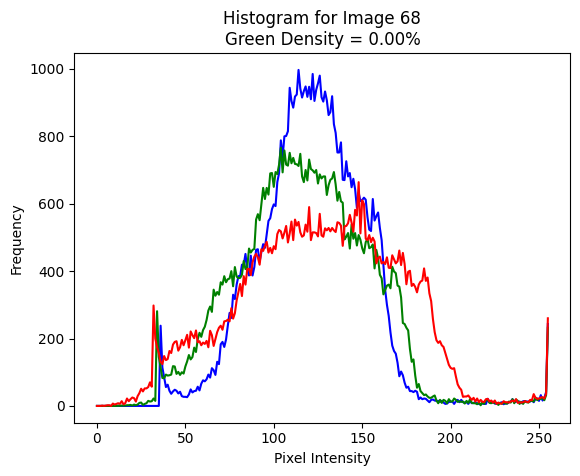


📌 Processing Image 69/209
🌿 Green Density: 5.57%


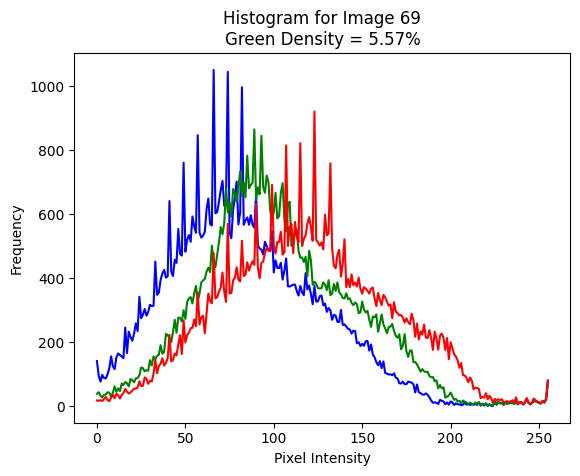


📌 Processing Image 70/209
🌿 Green Density: 4.23%


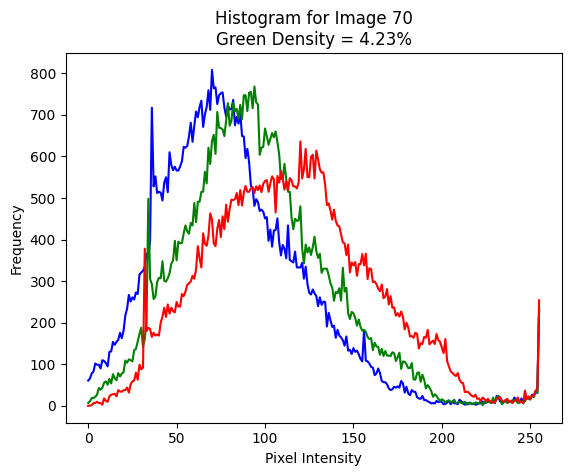


📌 Processing Image 71/209
🌿 Green Density: 3.94%


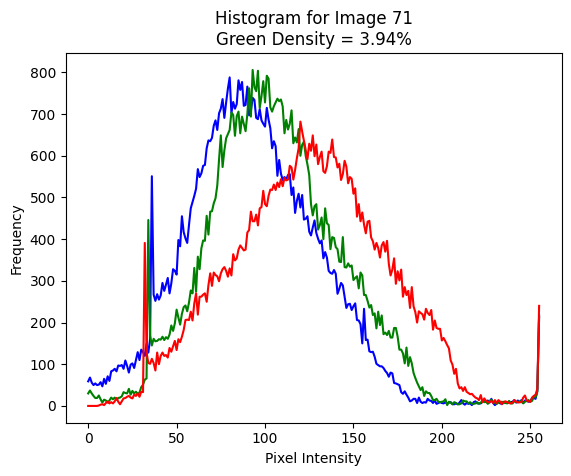


📌 Processing Image 72/209
🌿 Green Density: 5.69%


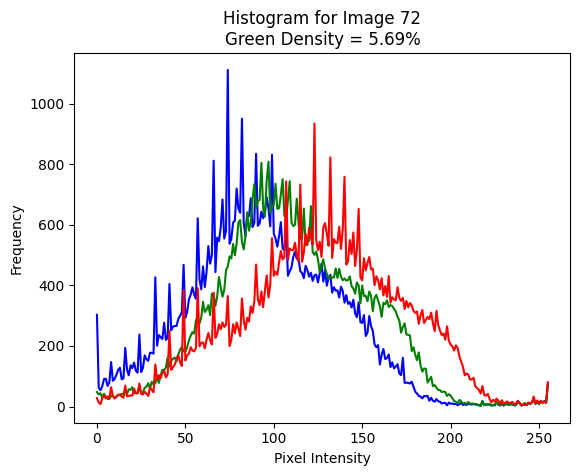


📌 Processing Image 73/209
🌿 Green Density: 7.75%


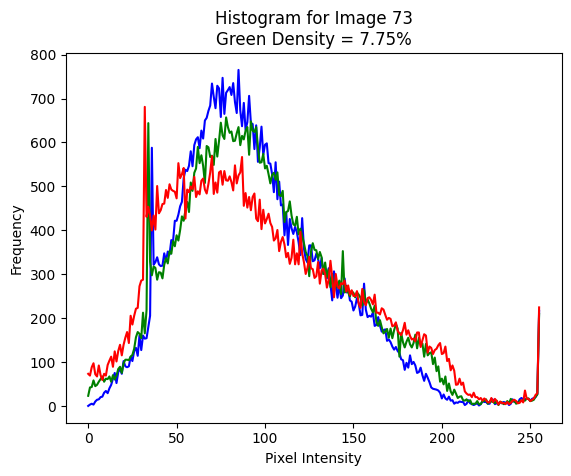


📌 Processing Image 74/209
🌿 Green Density: 11.62%


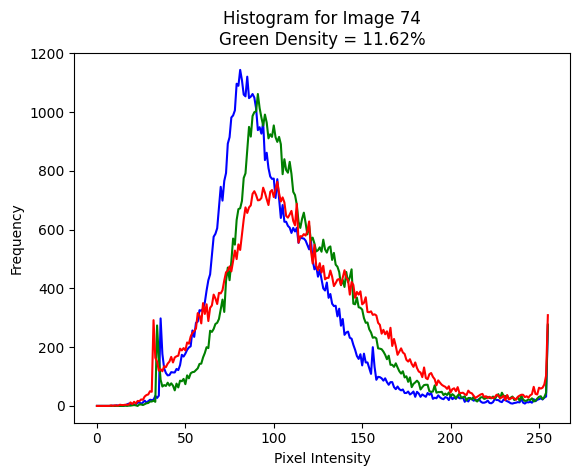


📌 Processing Image 75/209
🌿 Green Density: 0.00%


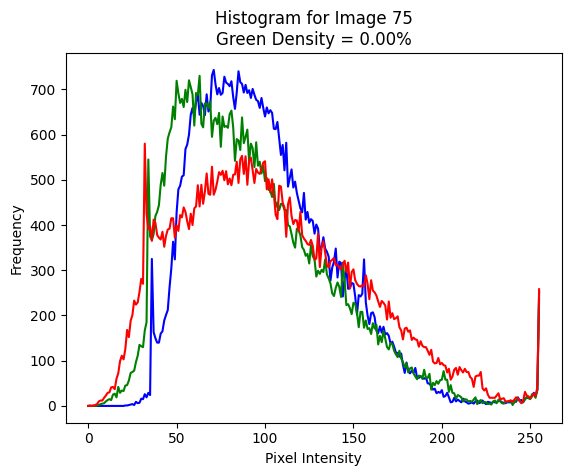


📌 Processing Image 76/209
🌿 Green Density: 12.75%


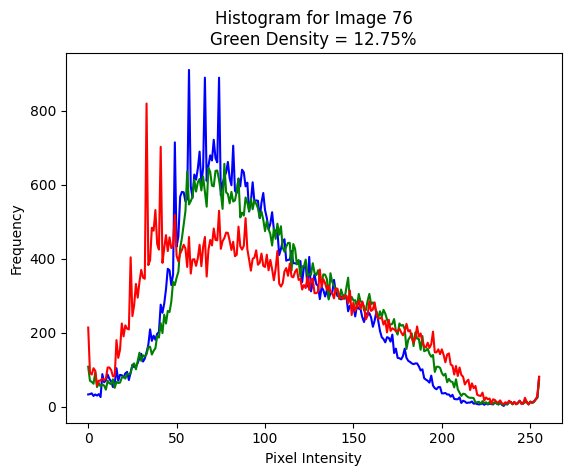


📌 Processing Image 77/209
🌿 Green Density: 0.04%


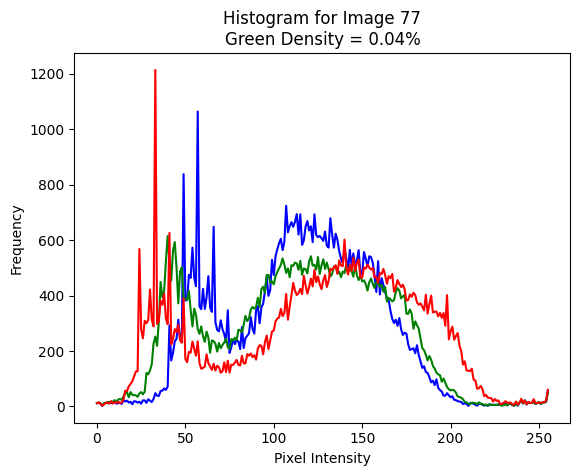


📌 Processing Image 78/209
🌿 Green Density: 0.01%


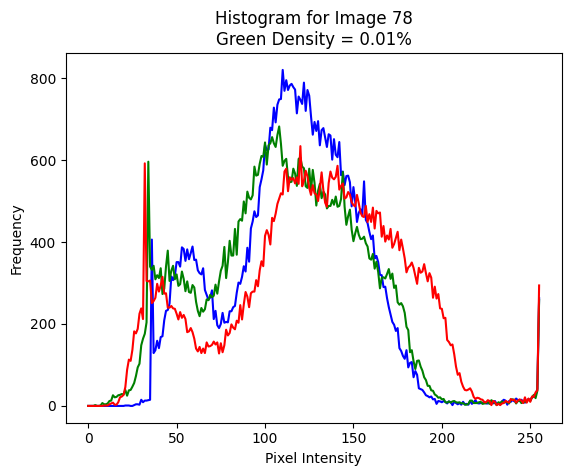


📌 Processing Image 79/209
🌿 Green Density: 0.00%


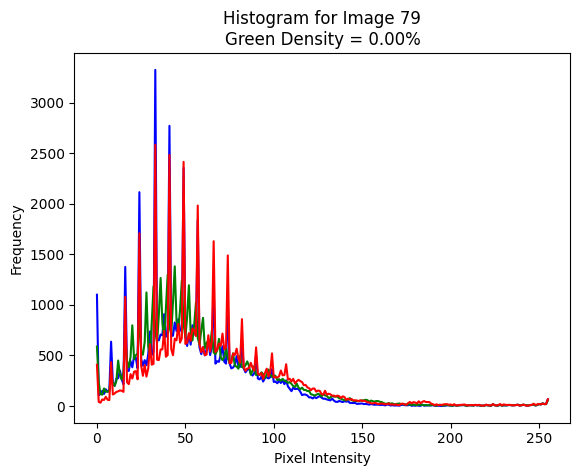


📌 Processing Image 80/209
🌿 Green Density: 0.00%


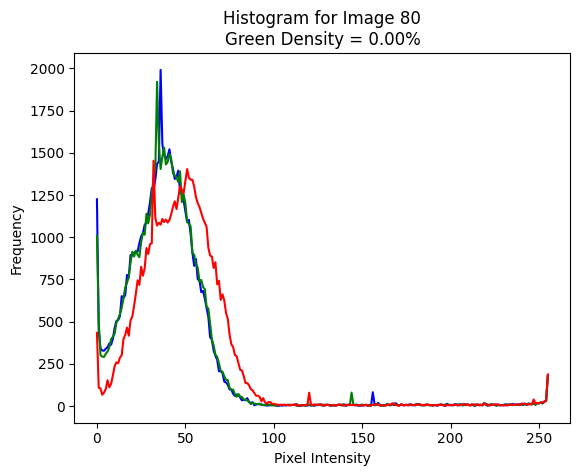


📌 Processing Image 81/209
🌿 Green Density: 0.00%


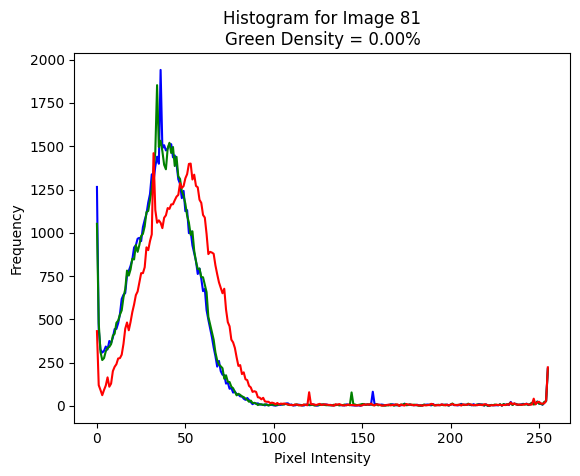


📌 Processing Image 82/209
🌿 Green Density: 0.00%


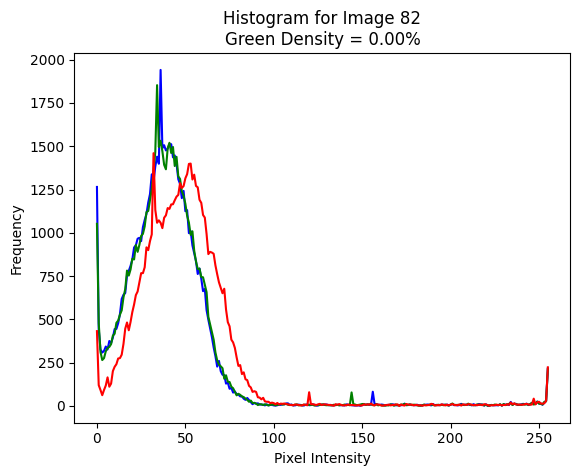


📌 Processing Image 83/209
🌿 Green Density: 2.98%


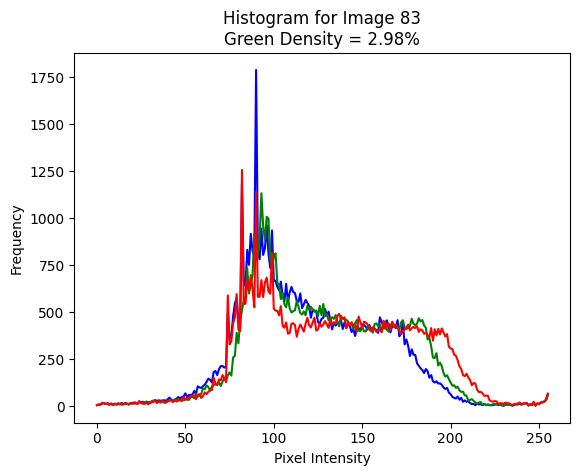


📌 Processing Image 84/209
🌿 Green Density: 2.83%


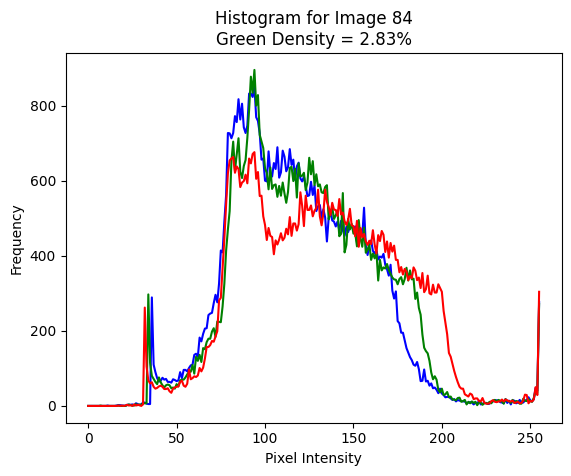


📌 Processing Image 85/209
🌿 Green Density: 1.17%


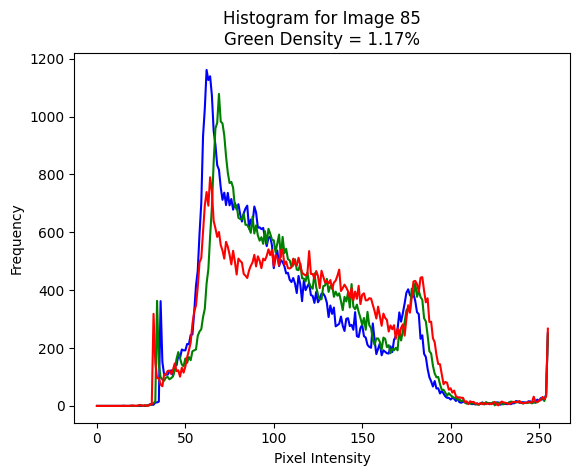


📌 Processing Image 86/209
🌿 Green Density: 5.38%


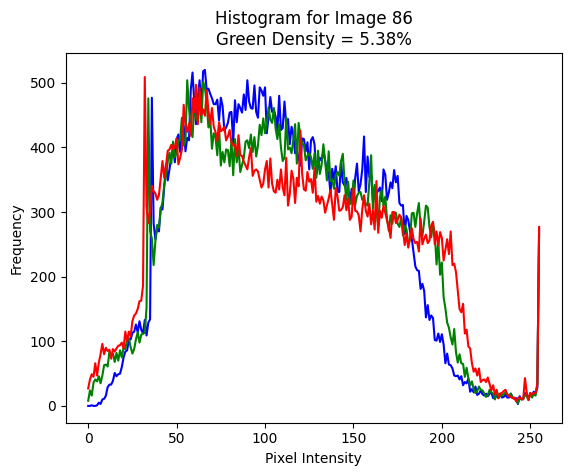


📌 Processing Image 87/209
🌿 Green Density: 6.04%


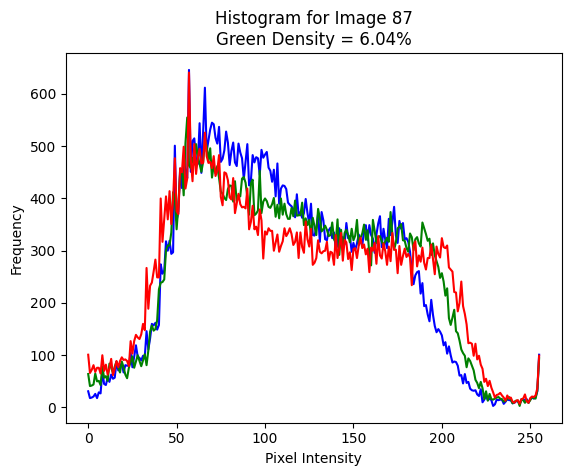


📌 Processing Image 88/209
🌿 Green Density: 5.95%


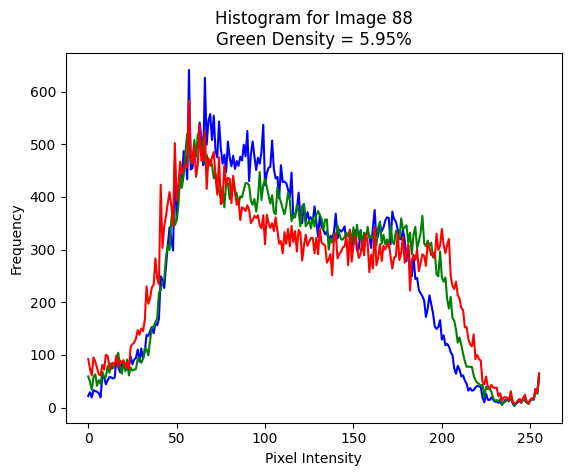


📌 Processing Image 89/209
🌿 Green Density: 5.36%


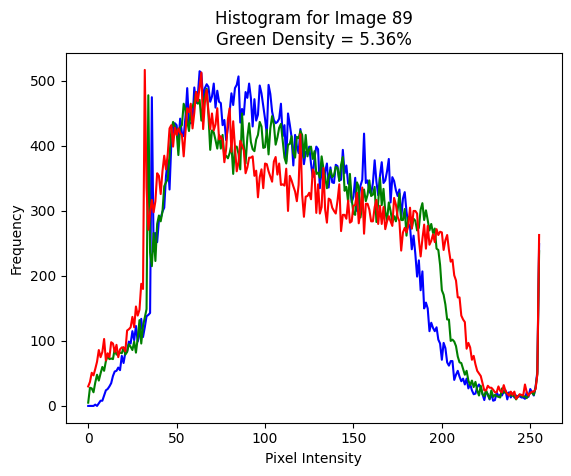


📌 Processing Image 90/209
🌿 Green Density: 35.15%


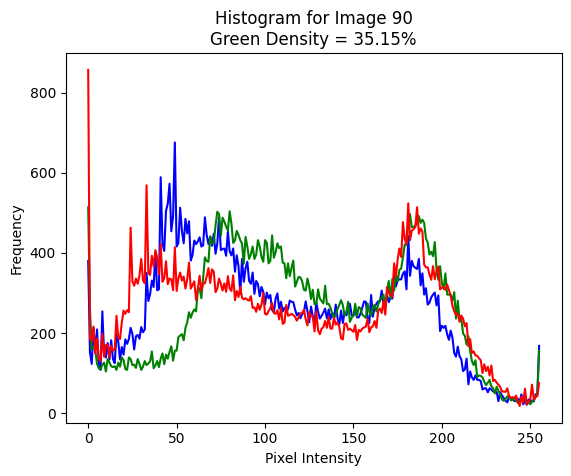


📌 Processing Image 91/209
🌿 Green Density: 0.65%


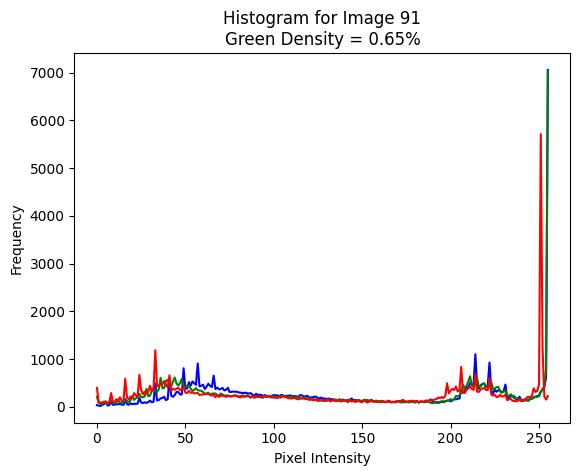


📌 Processing Image 92/209
🌿 Green Density: 29.92%


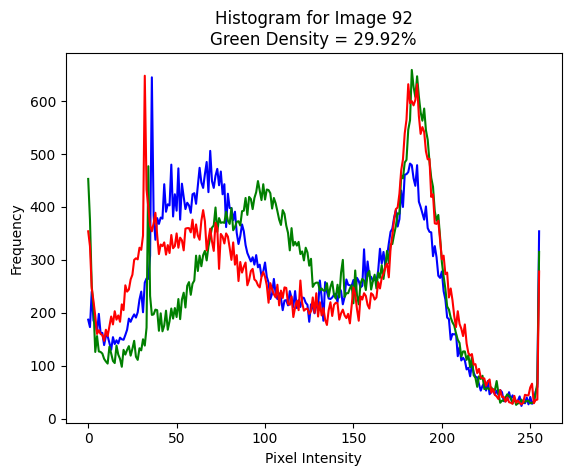


📌 Processing Image 93/209
🌿 Green Density: 0.00%


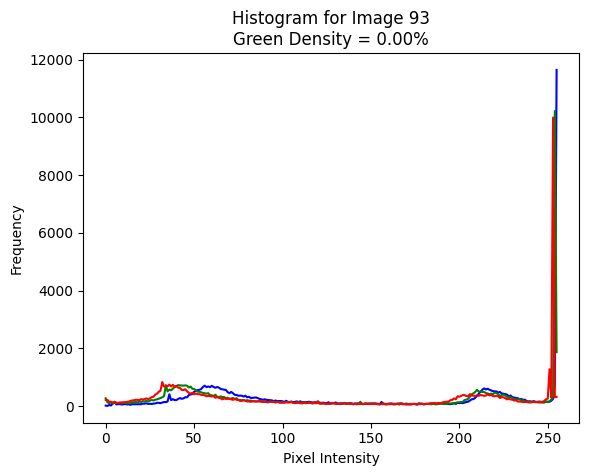


📌 Processing Image 94/209
🌿 Green Density: 1.14%


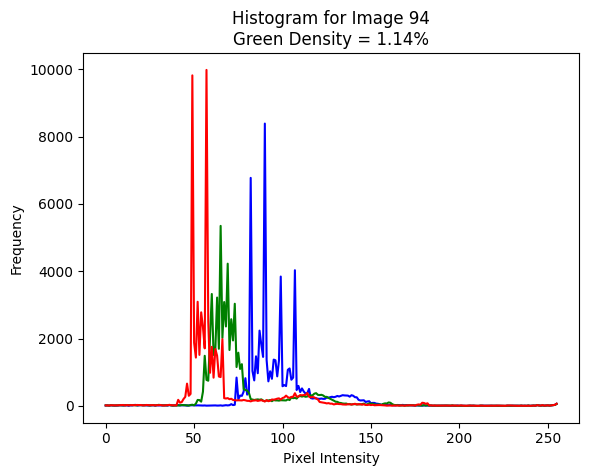


📌 Processing Image 95/209
🌿 Green Density: 0.00%


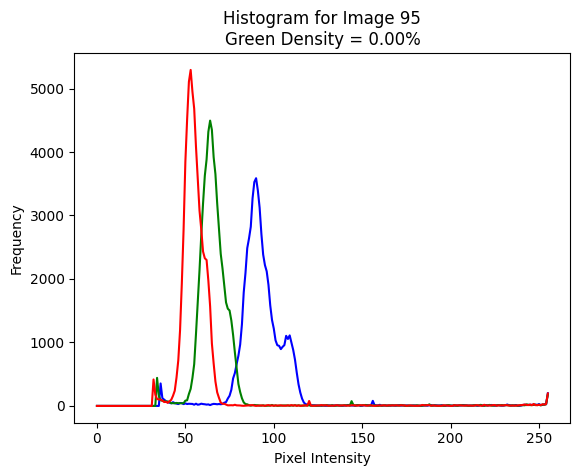


📌 Processing Image 96/209
🌿 Green Density: 4.77%


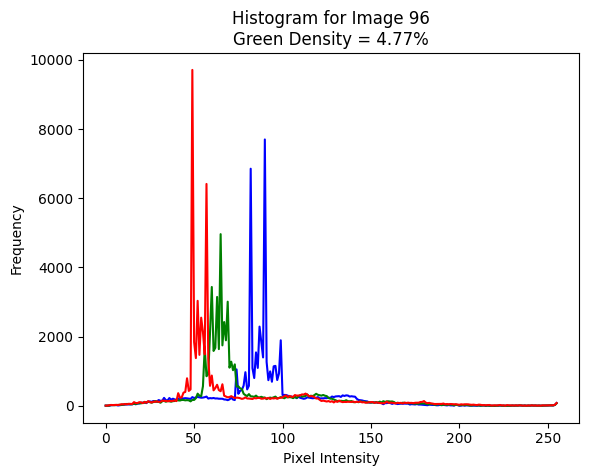


📌 Processing Image 97/209
🌿 Green Density: 4.33%


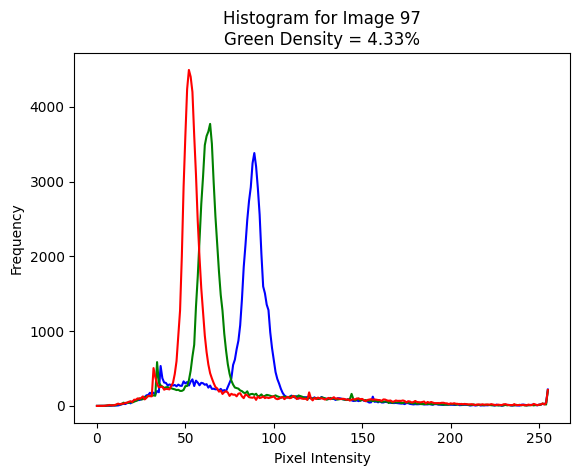


📌 Processing Image 98/209
🌿 Green Density: 19.85%


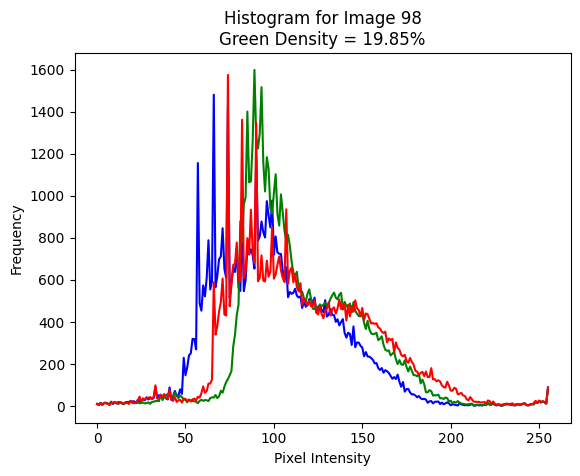


📌 Processing Image 99/209
🌿 Green Density: 13.12%


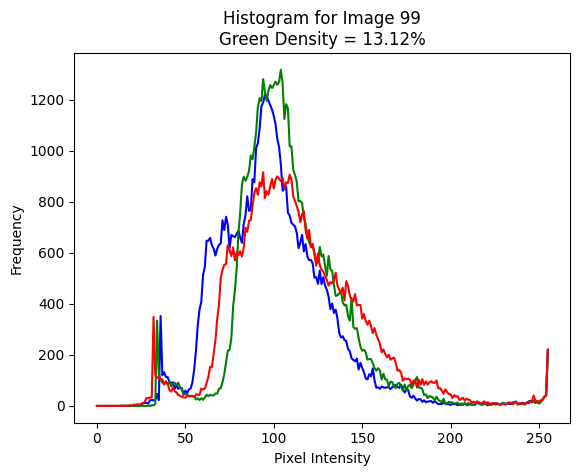


📌 Processing Image 100/209
🌿 Green Density: 5.02%


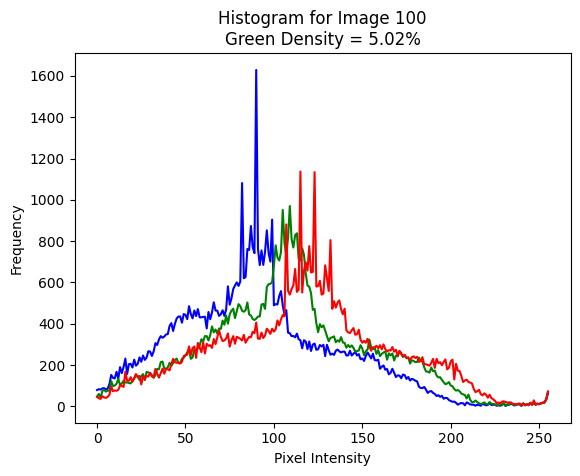


📌 Processing Image 101/209
🌿 Green Density: 5.27%


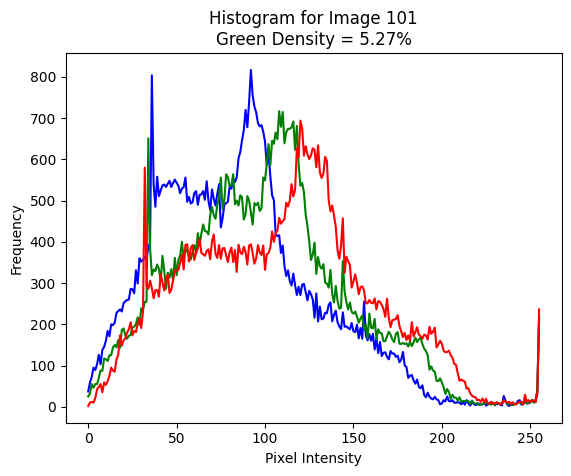


📌 Processing Image 102/209
🌿 Green Density: 4.64%


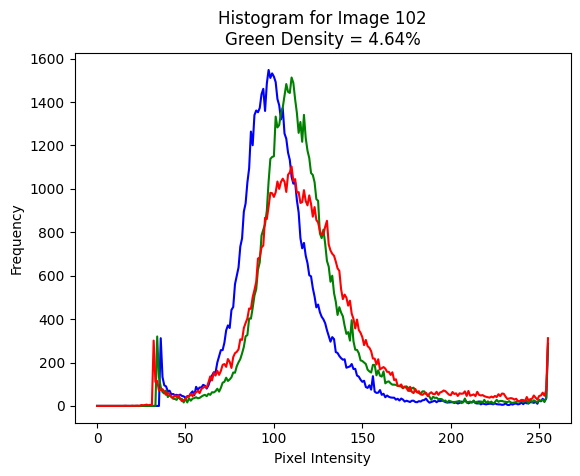


📌 Processing Image 103/209
🌿 Green Density: 5.02%


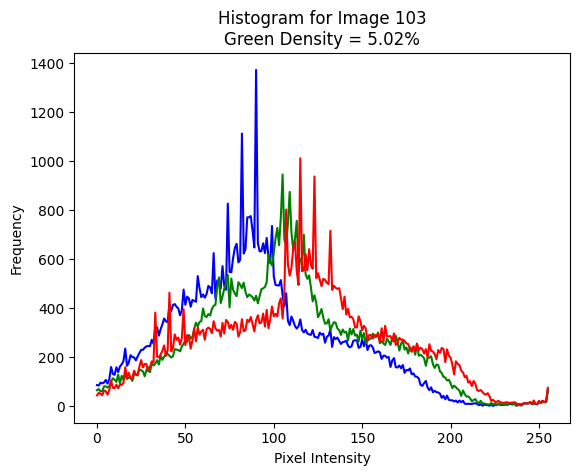


📌 Processing Image 104/209
🌿 Green Density: 5.31%


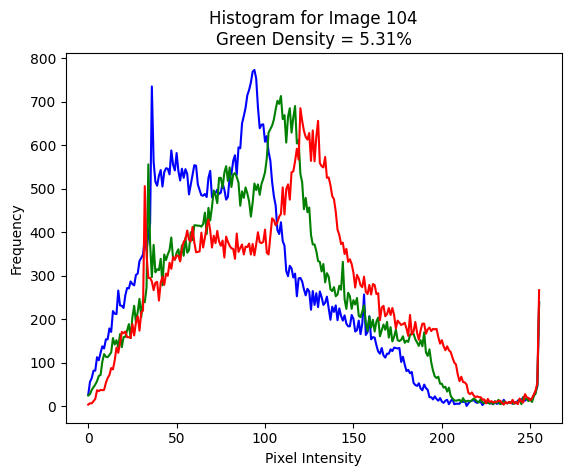


📌 Processing Image 105/209
🌿 Green Density: 0.95%


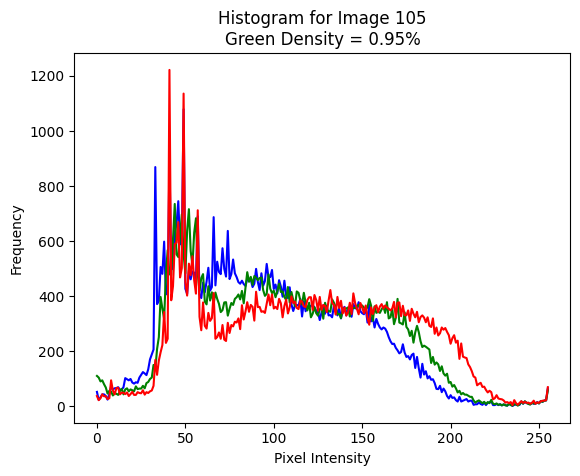


📌 Processing Image 106/209
🌿 Green Density: 0.26%


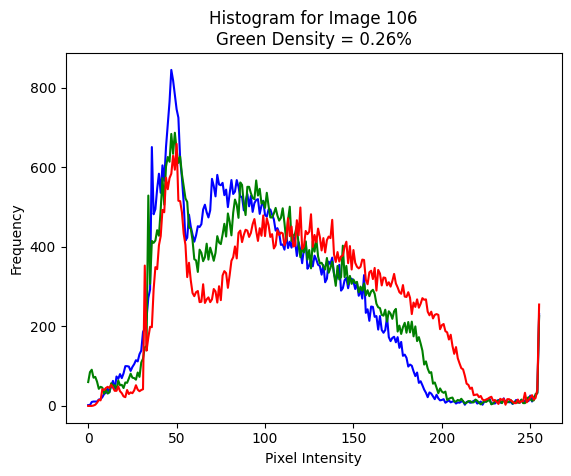


📌 Processing Image 107/209
🌿 Green Density: 4.83%


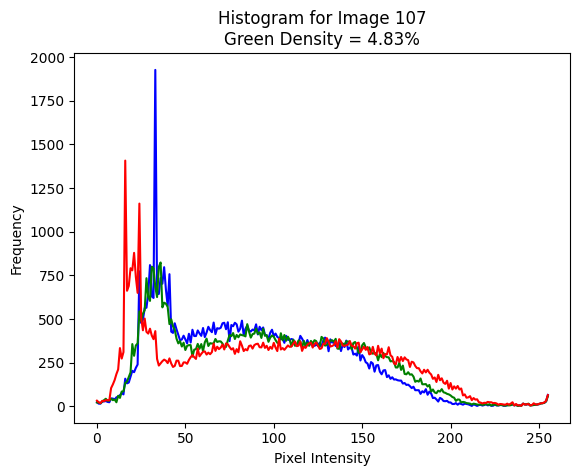


📌 Processing Image 108/209
🌿 Green Density: 3.05%


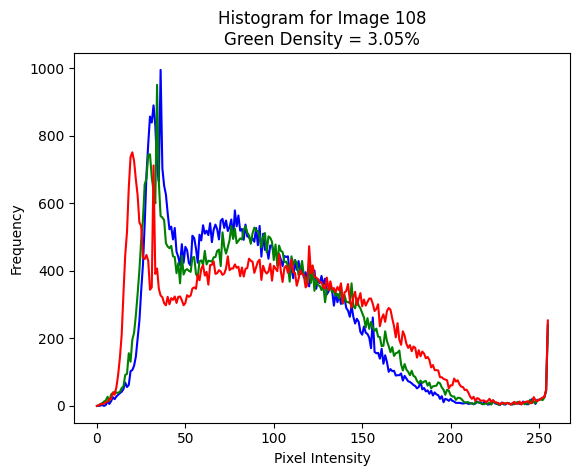


📌 Processing Image 109/209
🌿 Green Density: 0.26%


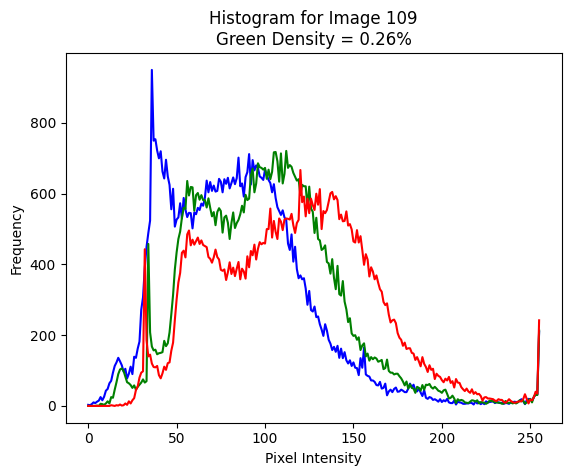


📌 Processing Image 110/209
🌿 Green Density: 2.16%


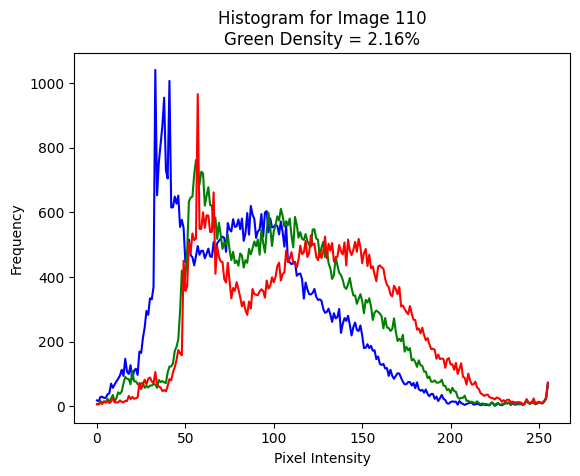


📌 Processing Image 111/209
🌿 Green Density: 1.33%


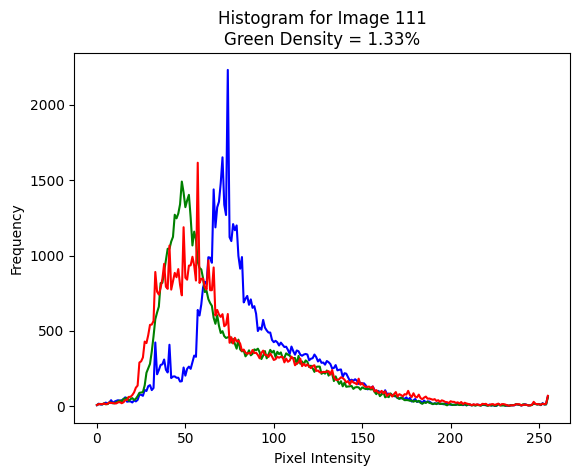


📌 Processing Image 112/209
🌿 Green Density: 0.18%


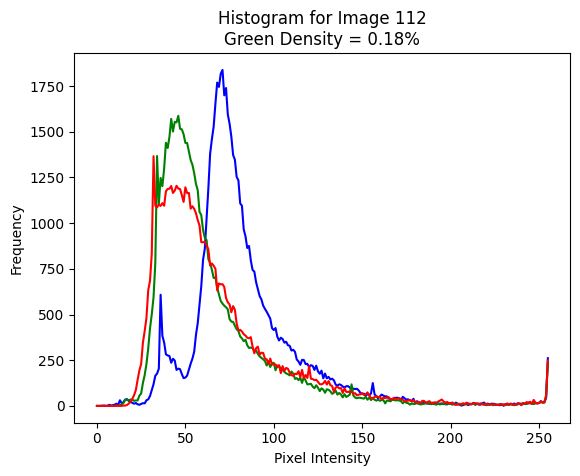


📌 Processing Image 113/209
🌿 Green Density: 13.51%


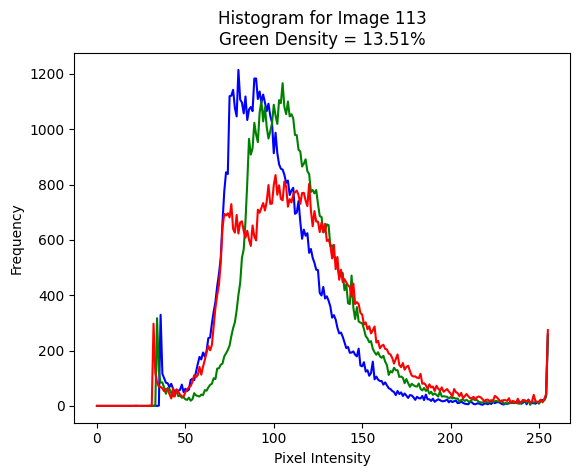


📌 Processing Image 114/209
🌿 Green Density: 2.73%


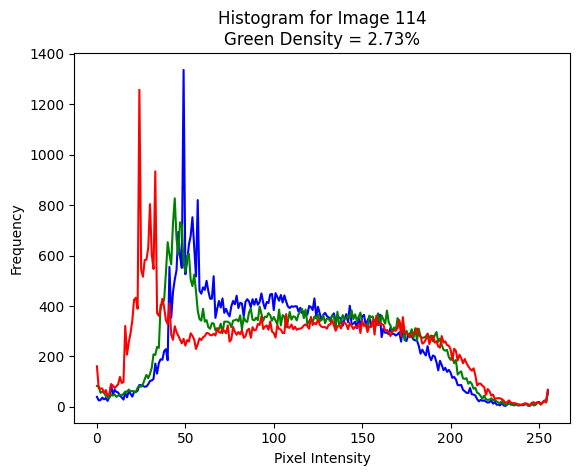


📌 Processing Image 115/209
🌿 Green Density: 1.72%


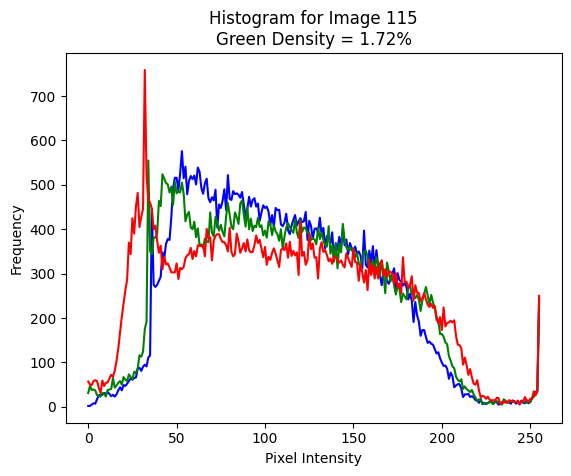


📌 Processing Image 116/209
🌿 Green Density: 5.19%


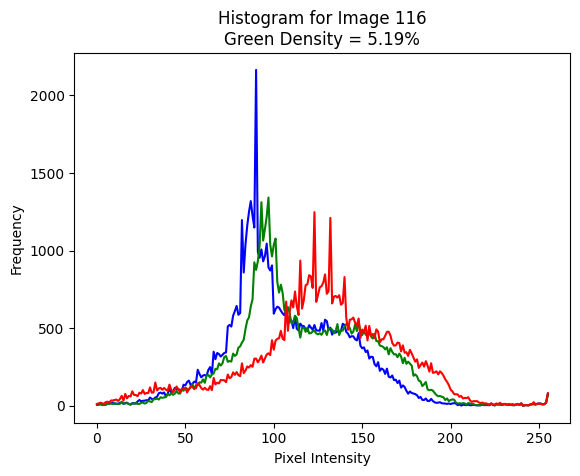


📌 Processing Image 117/209
🌿 Green Density: 5.15%


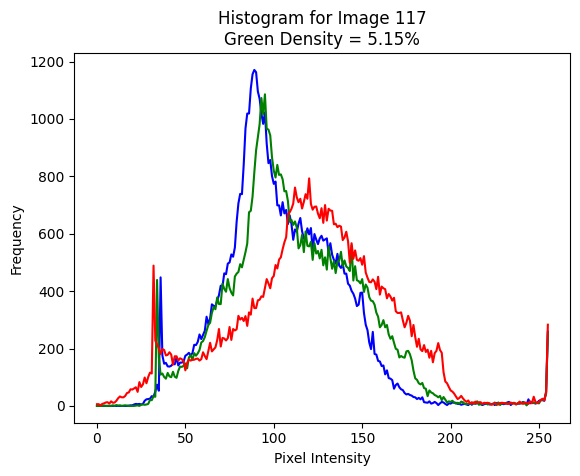


📌 Processing Image 118/209
🌿 Green Density: 2.38%


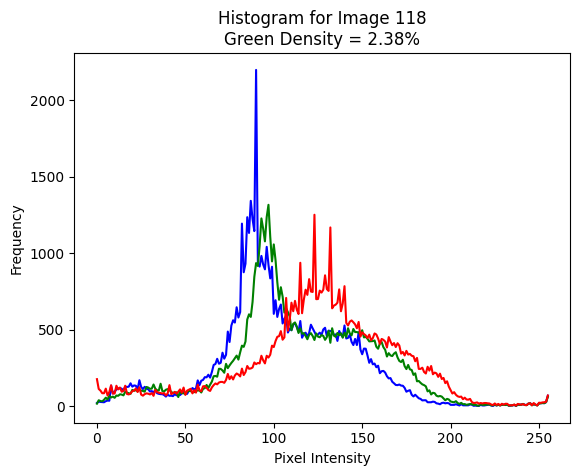


📌 Processing Image 119/209
🌿 Green Density: 2.00%


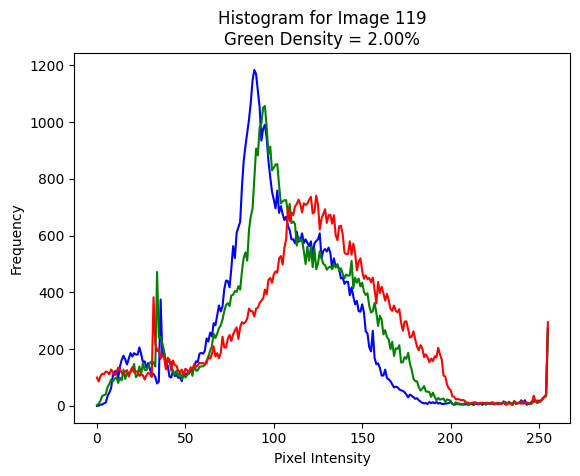


📌 Processing Image 120/209
🌿 Green Density: 8.93%


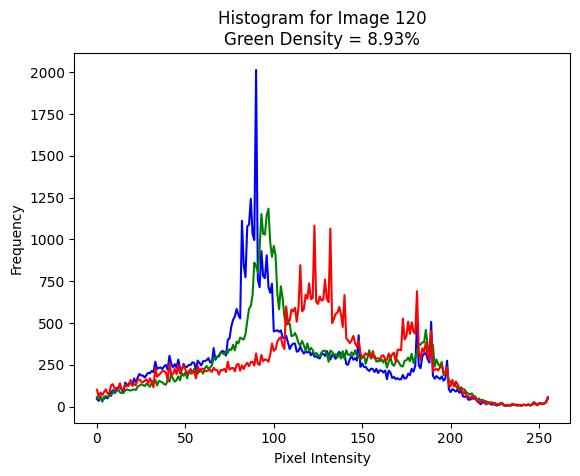


📌 Processing Image 121/209
🌿 Green Density: 13.30%


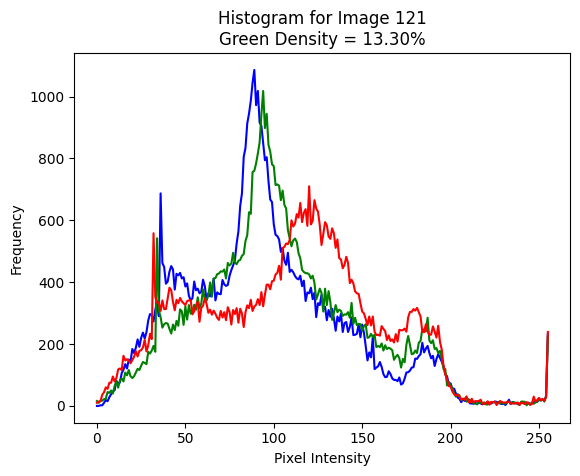


📌 Processing Image 122/209
🌿 Green Density: 1.68%


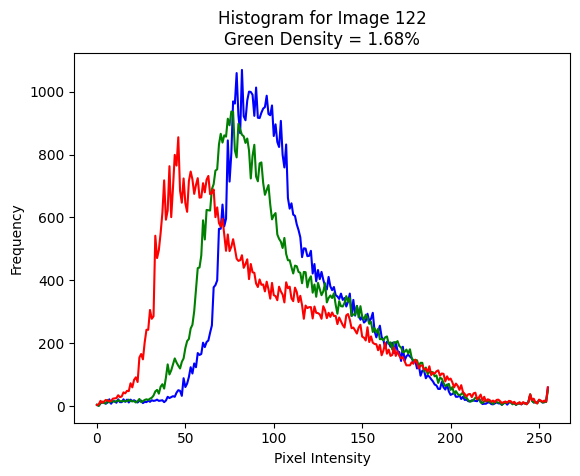


📌 Processing Image 123/209
🌿 Green Density: 0.02%


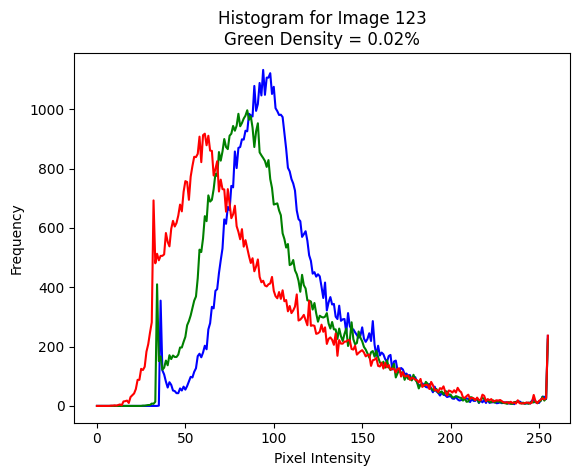


📌 Processing Image 124/209
🌿 Green Density: 12.15%


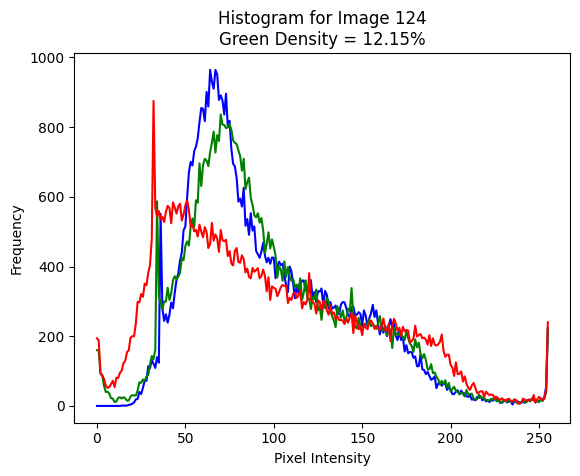


📌 Processing Image 125/209
🌿 Green Density: 20.27%


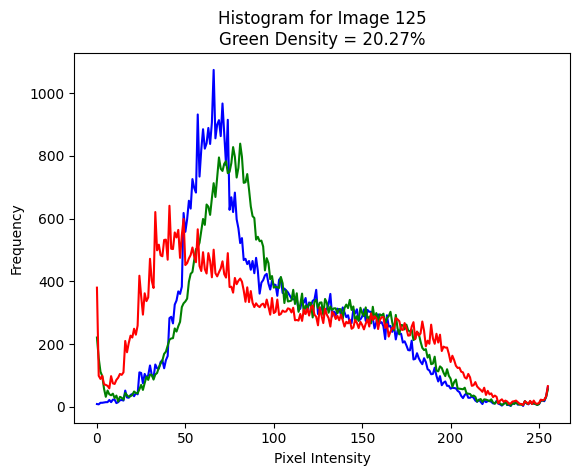


📌 Processing Image 126/209
🌿 Green Density: 5.83%


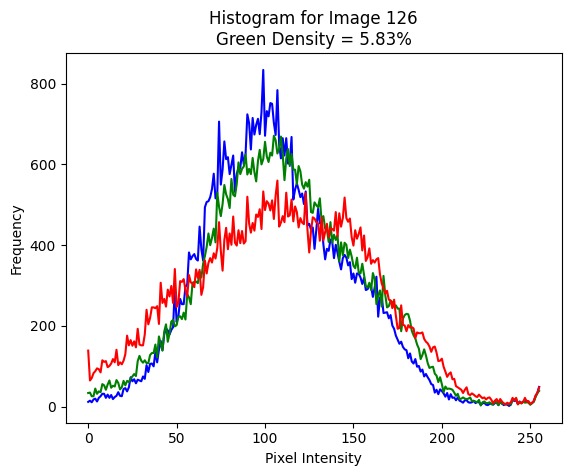


📌 Processing Image 127/209
🌿 Green Density: 3.90%


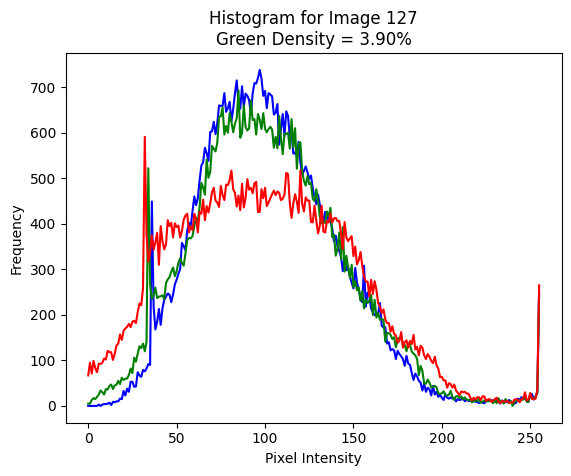


📌 Processing Image 128/209
🌿 Green Density: 4.41%


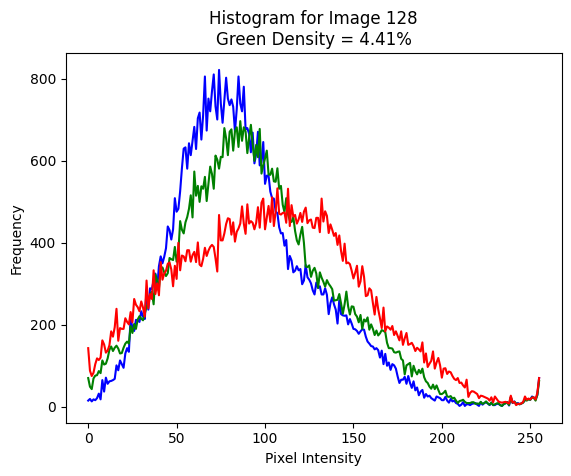


📌 Processing Image 129/209
🌿 Green Density: 4.03%


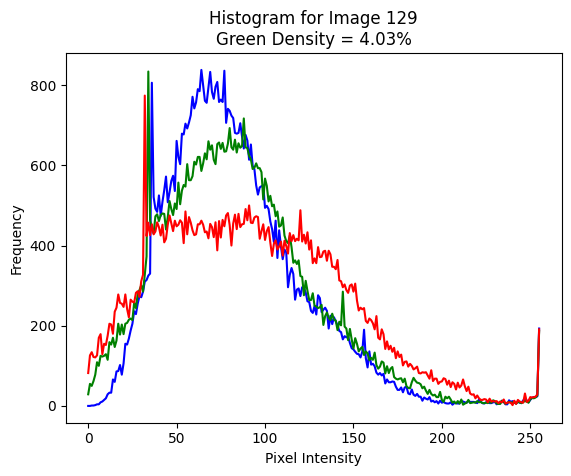


📌 Processing Image 130/209
🌿 Green Density: 0.97%


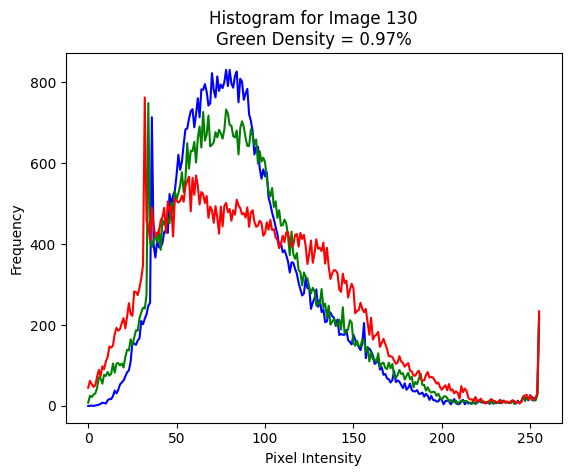


📌 Processing Image 131/209
🌿 Green Density: 2.03%


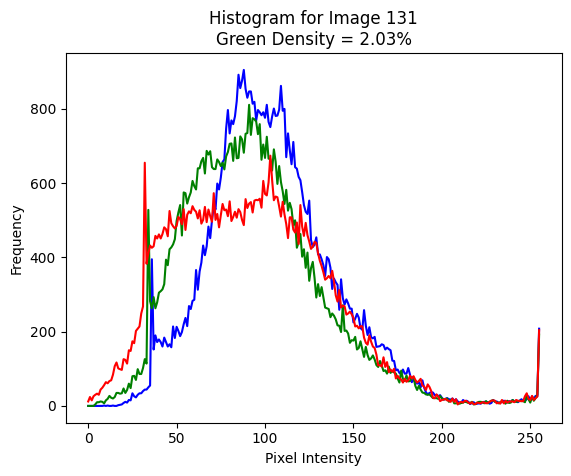


📌 Processing Image 132/209
🌿 Green Density: 2.60%


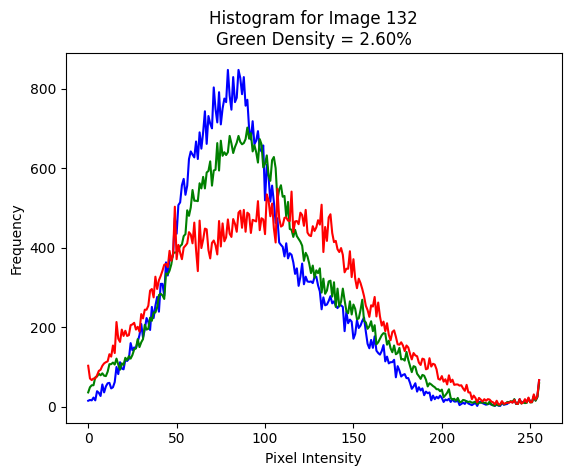


📌 Processing Image 133/209
🌿 Green Density: 0.22%


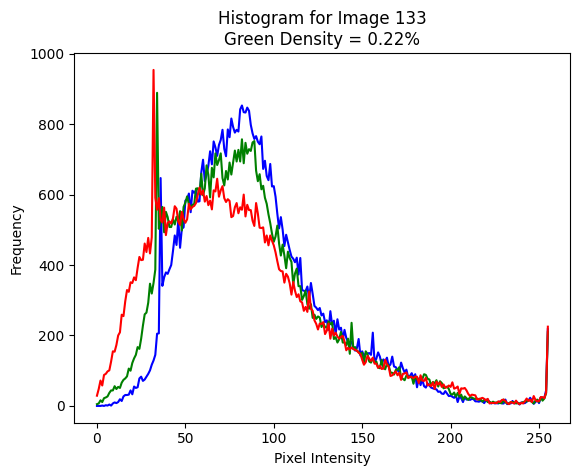


📌 Processing Image 134/209
🌿 Green Density: 2.04%


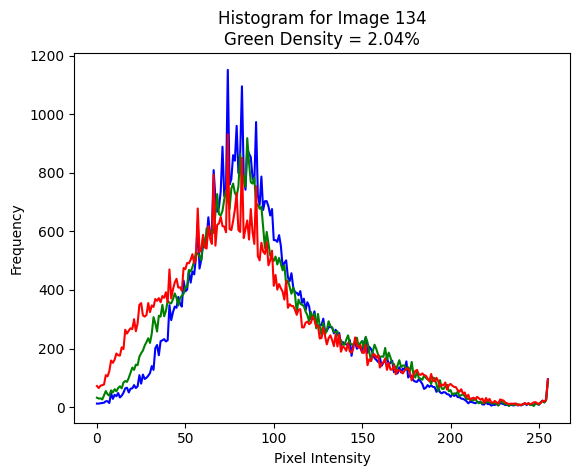


📌 Processing Image 135/209
🌿 Green Density: 3.41%


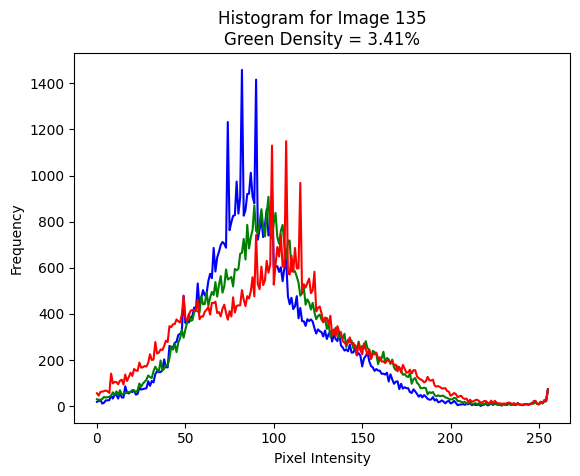


📌 Processing Image 136/209
🌿 Green Density: 1.05%


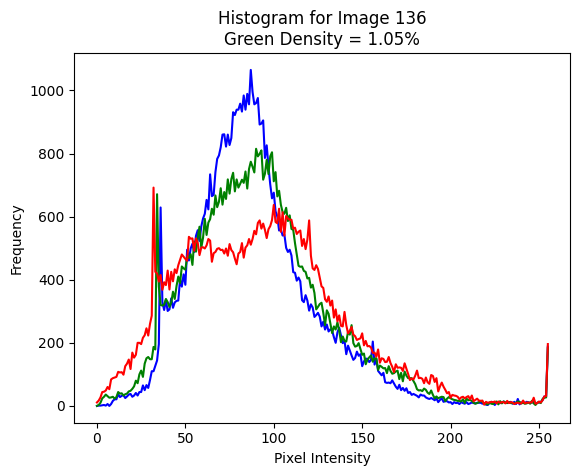


📌 Processing Image 137/209
🌿 Green Density: 1.99%


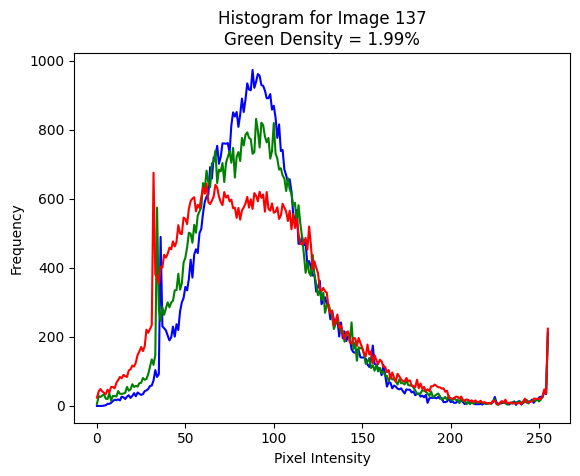


📌 Processing Image 138/209
🌿 Green Density: 0.48%


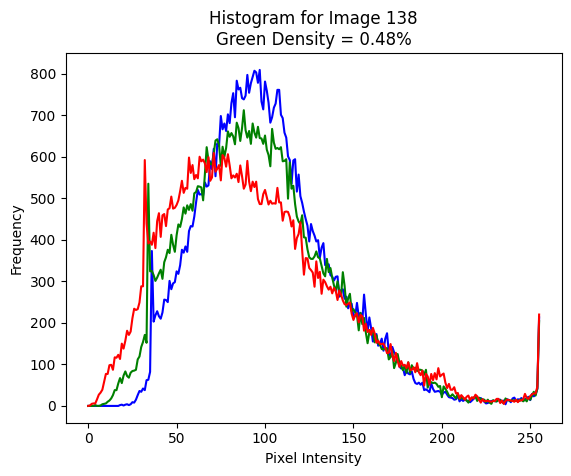


📌 Processing Image 139/209
🌿 Green Density: 2.32%


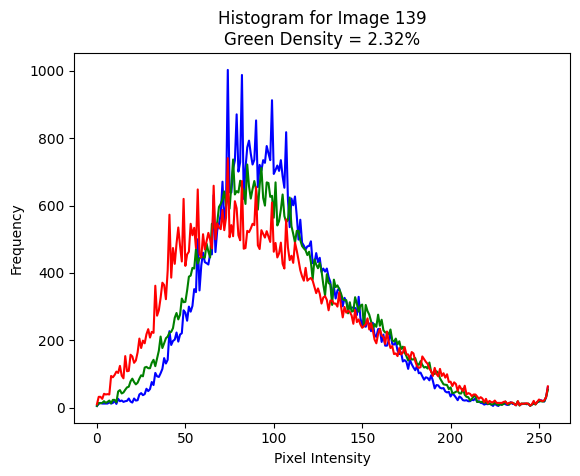


📌 Processing Image 140/209
🌿 Green Density: 2.60%


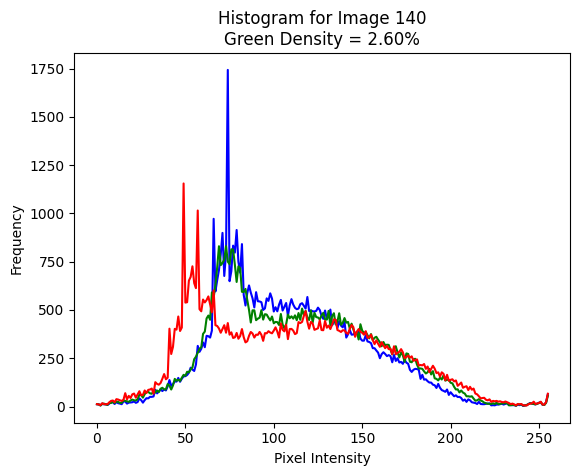


📌 Processing Image 141/209
🌿 Green Density: 0.85%


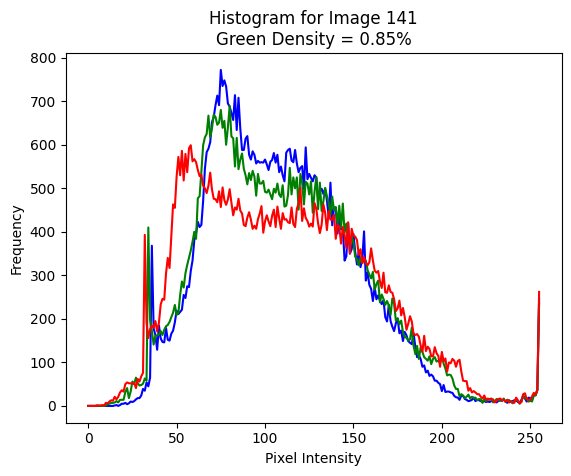


📌 Processing Image 142/209
🌿 Green Density: 3.77%


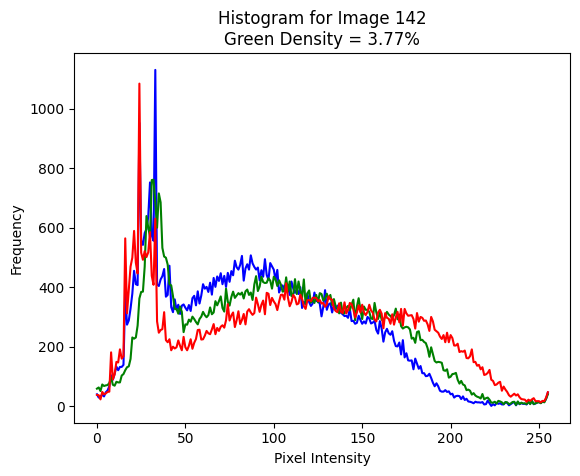


📌 Processing Image 143/209
🌿 Green Density: 1.94%


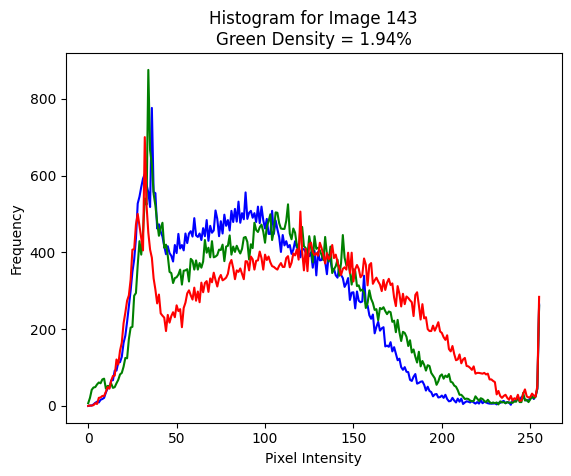


📌 Processing Image 144/209
🌿 Green Density: 3.78%


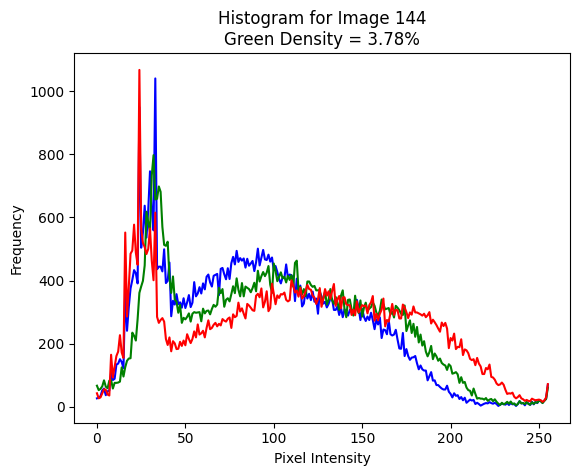


📌 Processing Image 145/209
🌿 Green Density: 1.91%


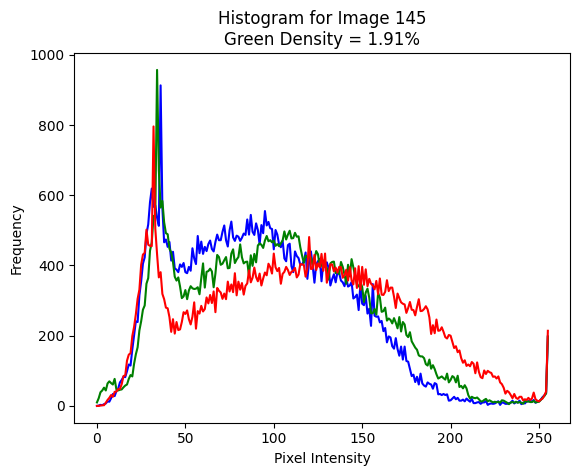


📌 Processing Image 146/209
🌿 Green Density: 1.00%


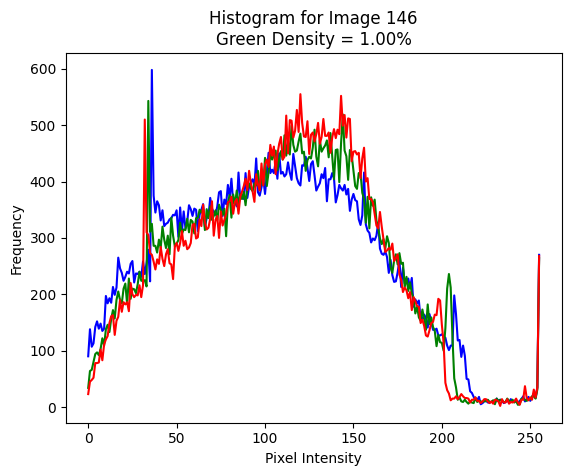


📌 Processing Image 147/209
🌿 Green Density: 2.69%


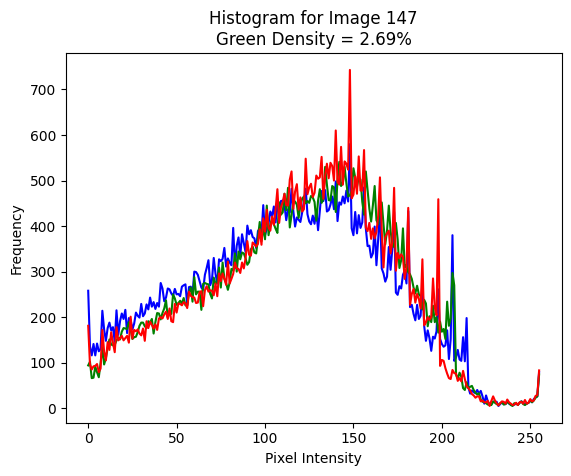


📌 Processing Image 148/209
🌿 Green Density: 5.54%


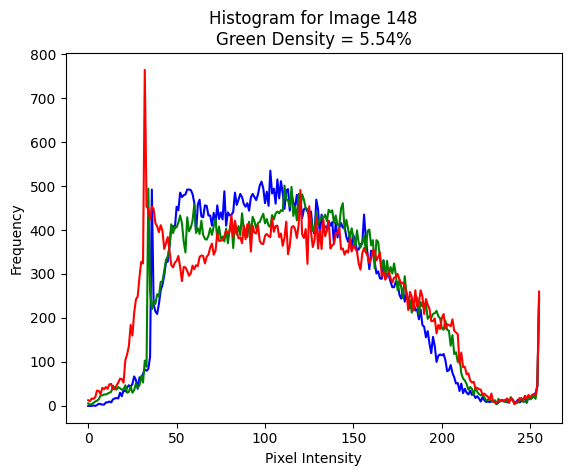


📌 Processing Image 149/209
🌿 Green Density: 9.36%


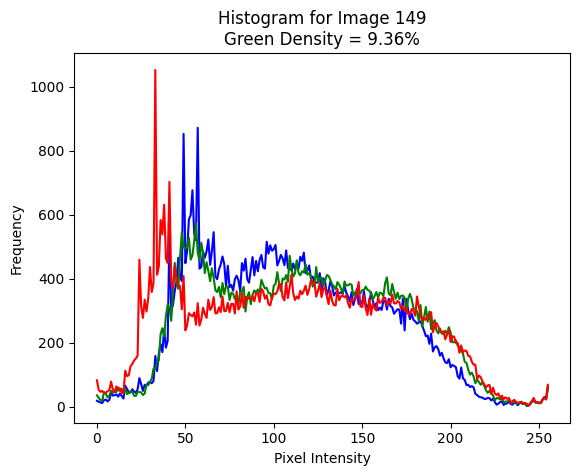


📌 Processing Image 150/209
🌿 Green Density: 5.79%


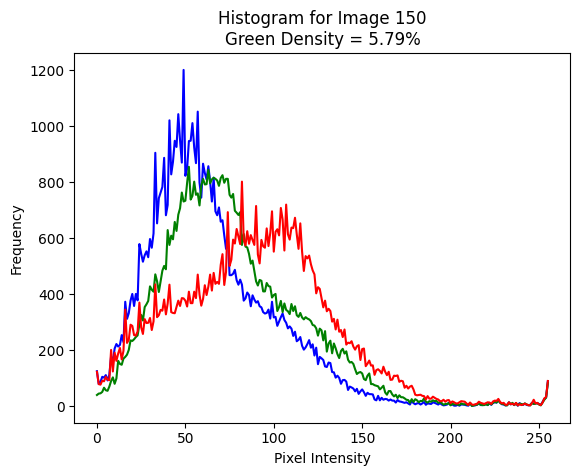


📌 Processing Image 151/209
🌿 Green Density: 5.91%


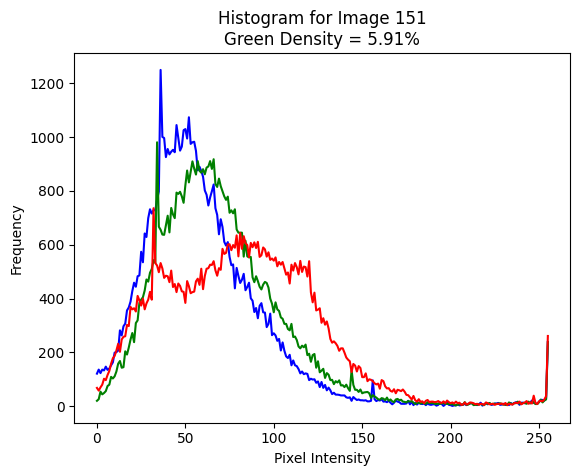


📌 Processing Image 152/209
🌿 Green Density: 3.57%


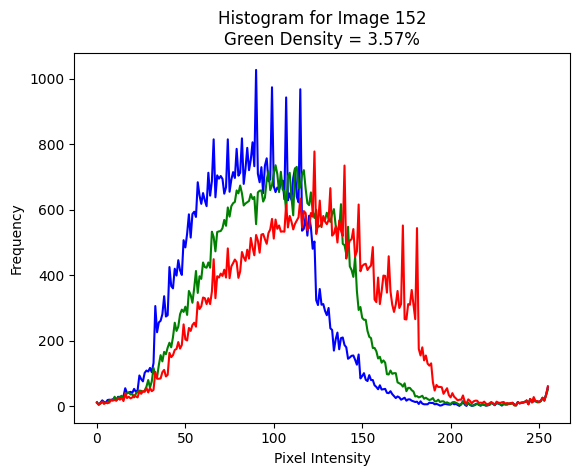


📌 Processing Image 153/209
🌿 Green Density: 3.57%


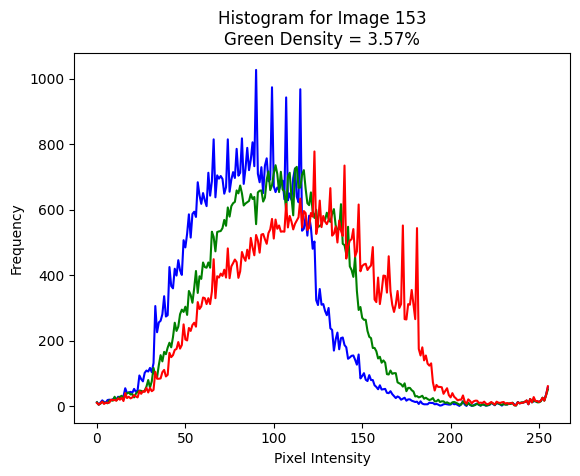


📌 Processing Image 154/209
🌿 Green Density: 0.13%


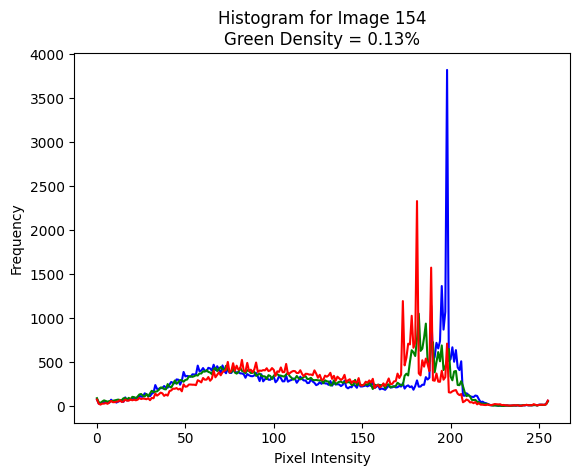


📌 Processing Image 155/209
🌿 Green Density: 0.02%


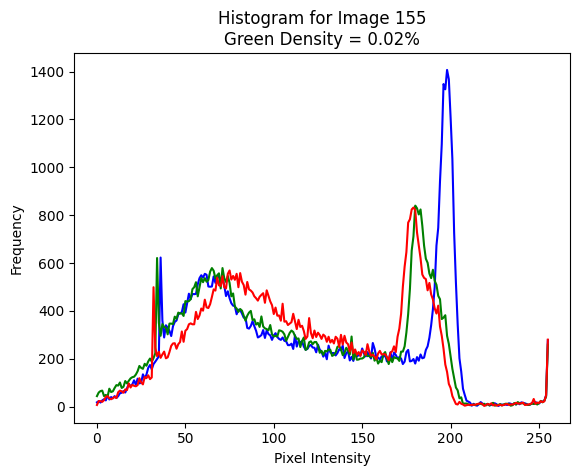


📌 Processing Image 156/209
🌿 Green Density: 0.03%


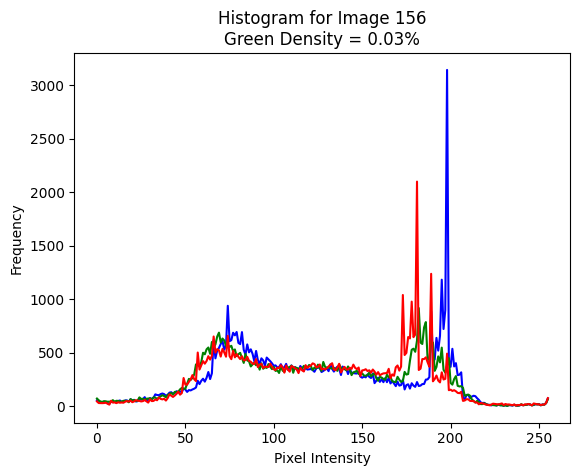


📌 Processing Image 157/209
🌿 Green Density: 0.00%


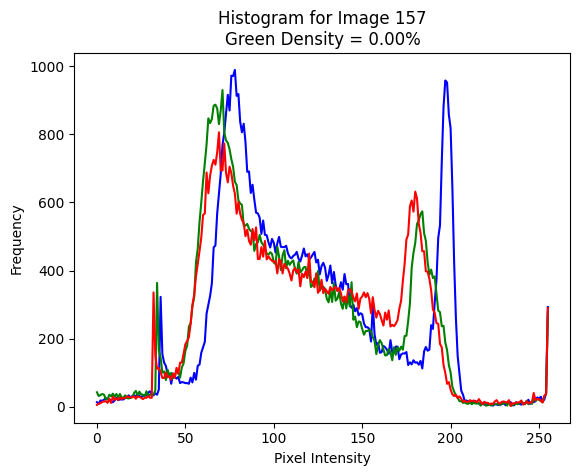


📌 Processing Image 158/209
🌿 Green Density: 0.72%


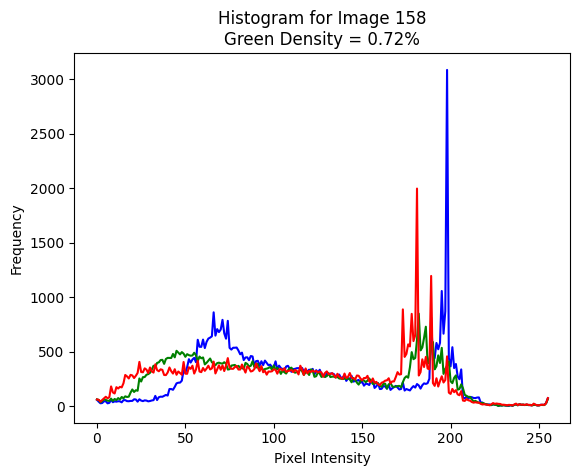


📌 Processing Image 159/209
🌿 Green Density: 0.00%


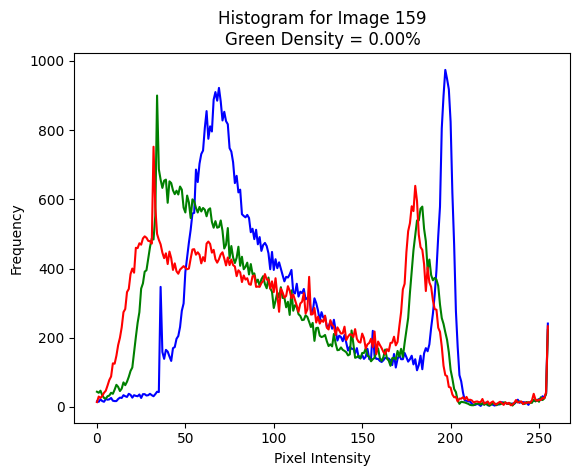


📌 Processing Image 160/209
🌿 Green Density: 0.92%


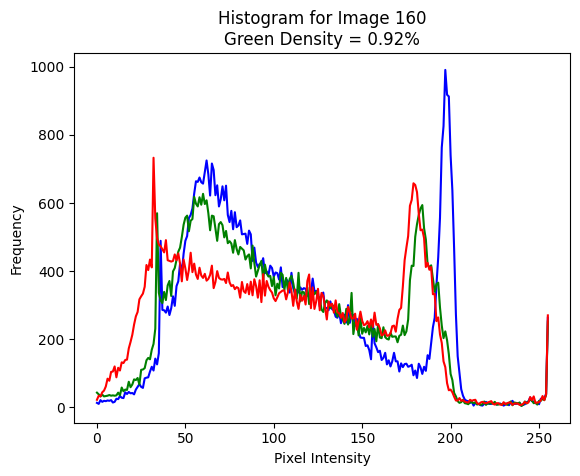


📌 Processing Image 161/209
🌿 Green Density: 1.83%


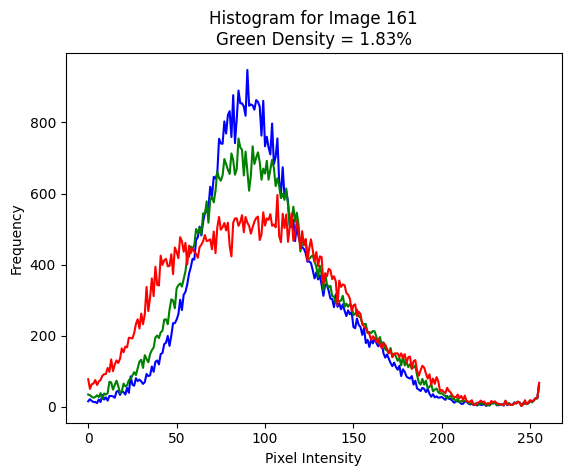


📌 Processing Image 162/209
🌿 Green Density: 1.83%


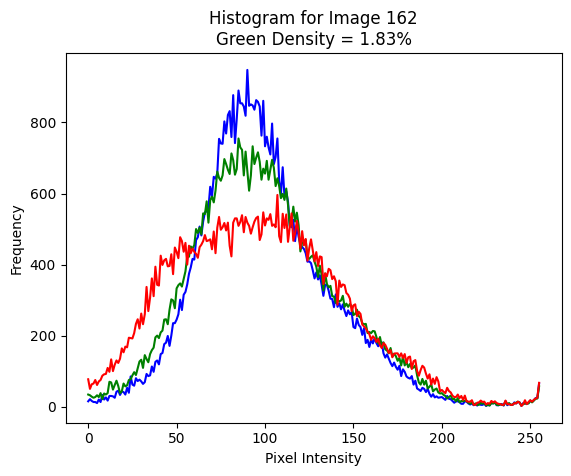


📌 Processing Image 163/209
🌿 Green Density: 1.83%


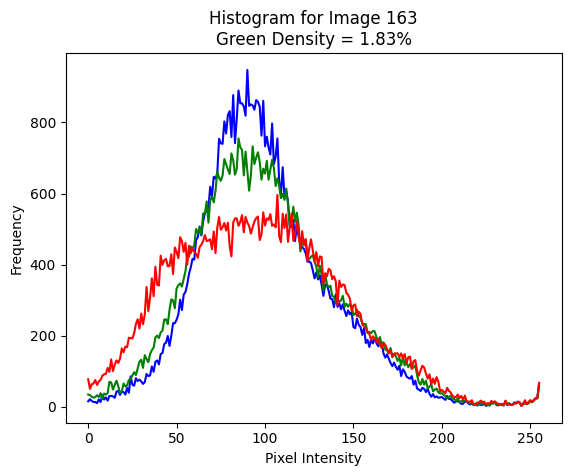


📌 Processing Image 164/209
🌿 Green Density: 0.62%


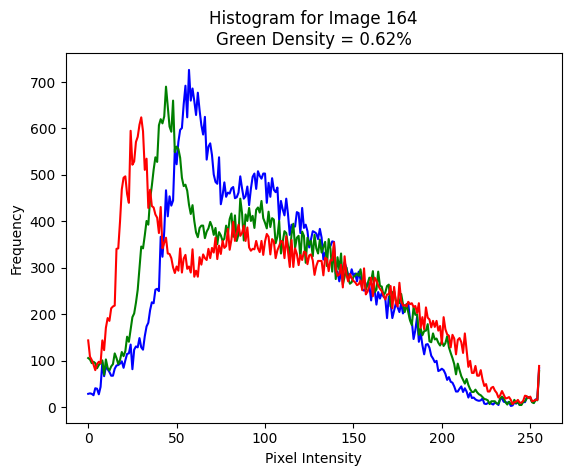


📌 Processing Image 165/209
🌿 Green Density: 0.24%


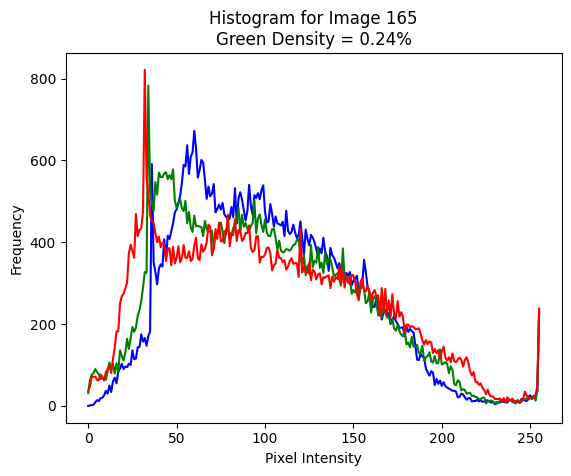


📌 Processing Image 166/209
🌿 Green Density: 0.15%


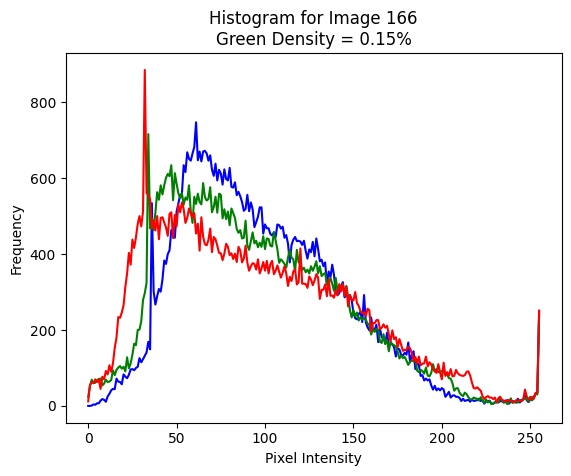


📌 Processing Image 167/209
🌿 Green Density: 0.16%


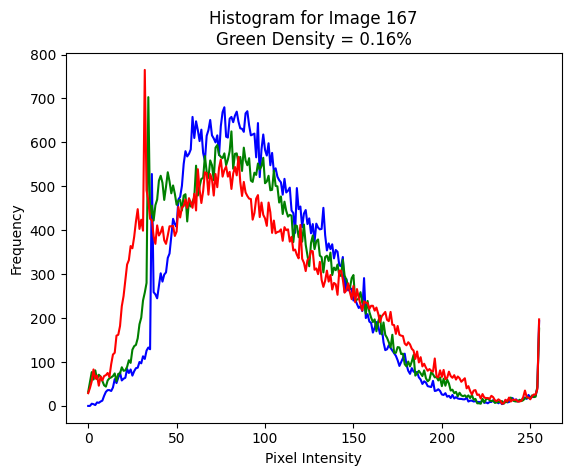


📌 Processing Image 168/209
🌿 Green Density: 0.90%


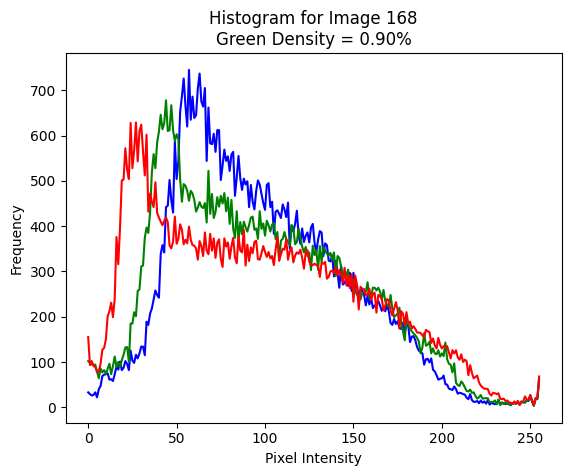


📌 Processing Image 169/209
🌿 Green Density: 2.21%


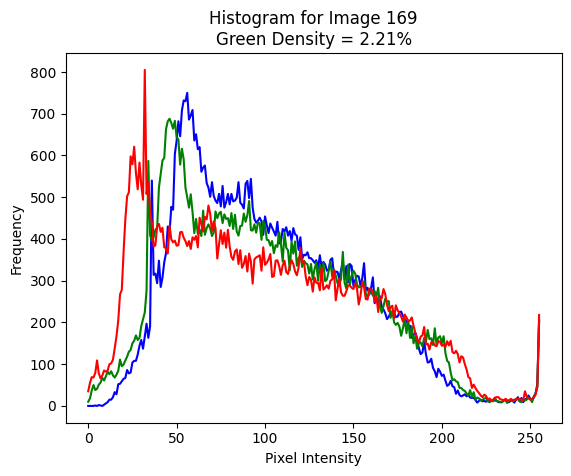


📌 Processing Image 170/209
🌿 Green Density: 1.31%


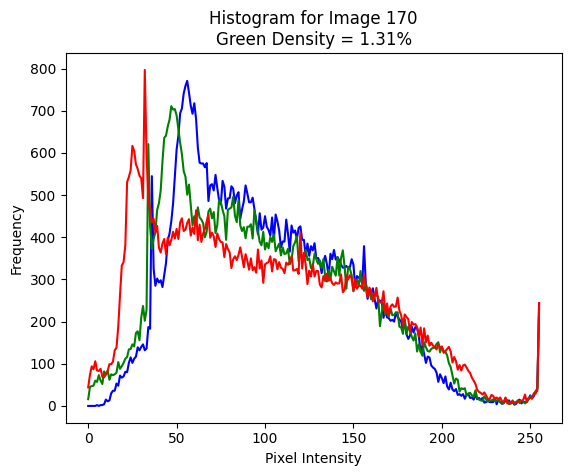


📌 Processing Image 171/209
🌿 Green Density: 1.03%


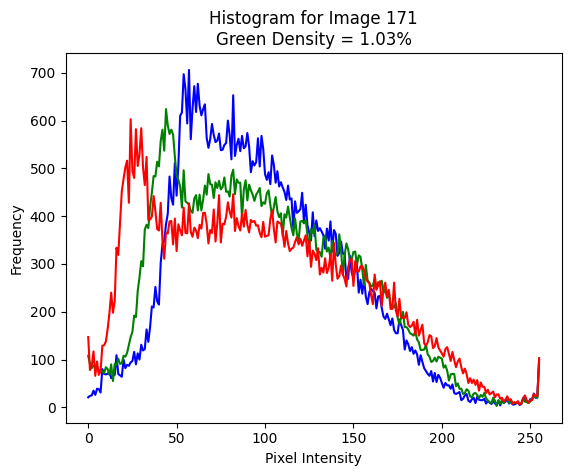


📌 Processing Image 172/209
🌿 Green Density: 2.61%


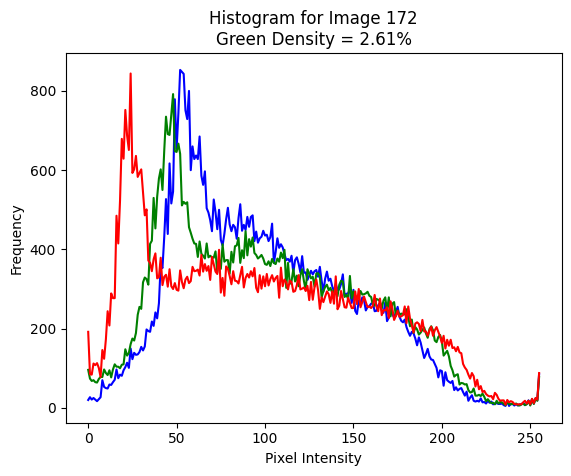


📌 Processing Image 173/209
🌿 Green Density: 2.00%


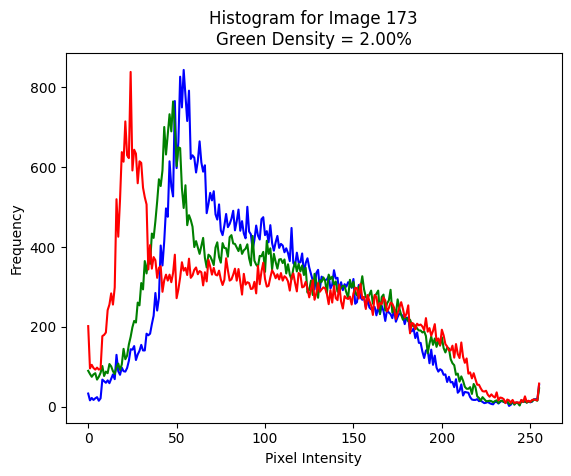


📌 Processing Image 174/209
🌿 Green Density: 5.09%


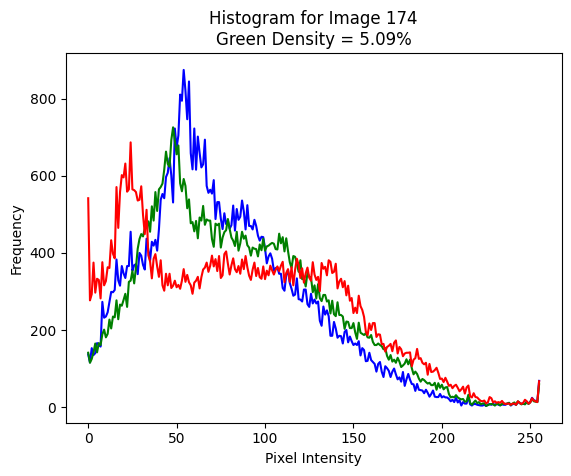


📌 Processing Image 175/209
🌿 Green Density: 4.91%


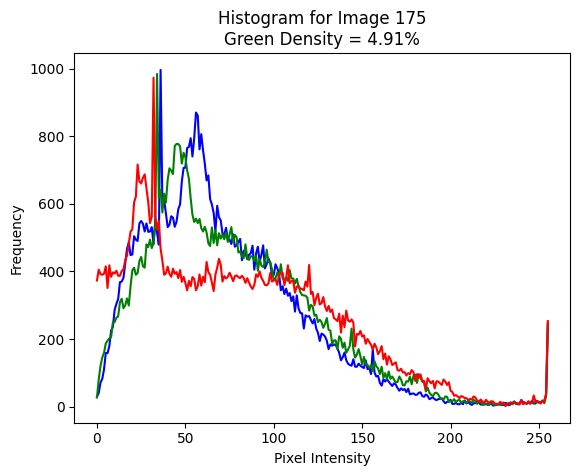


📌 Processing Image 176/209
🌿 Green Density: 19.53%


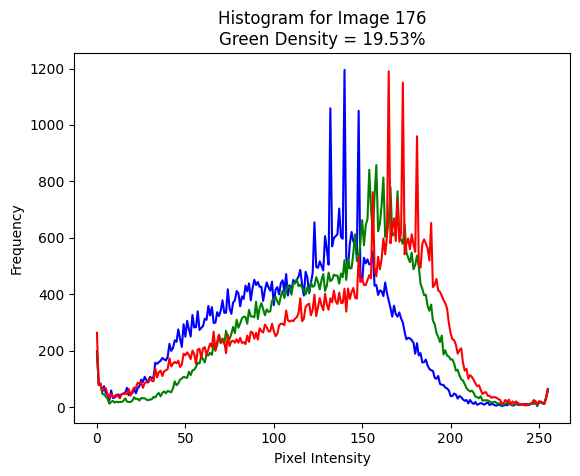


📌 Processing Image 177/209
🌿 Green Density: 21.89%


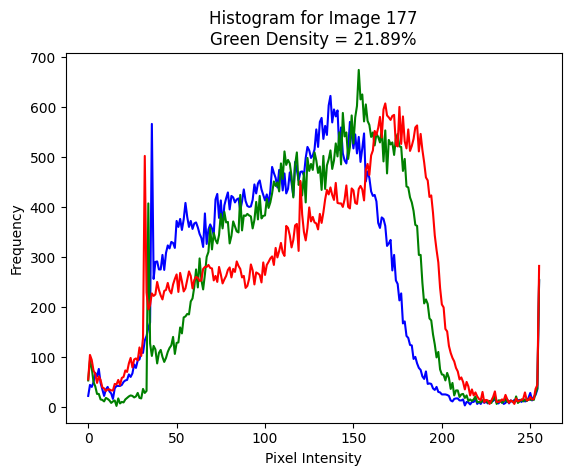


📌 Processing Image 178/209
🌿 Green Density: 11.20%


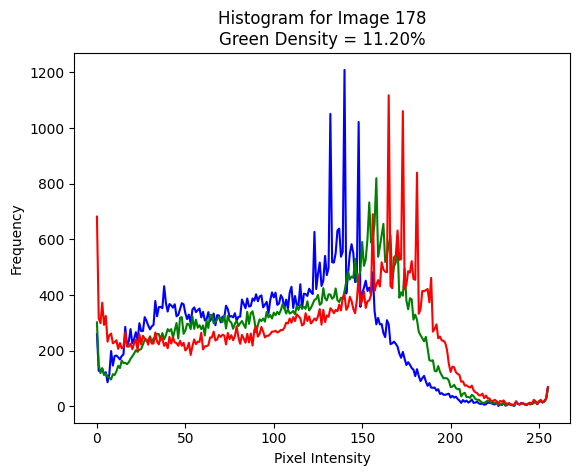


📌 Processing Image 179/209
🌿 Green Density: 12.43%


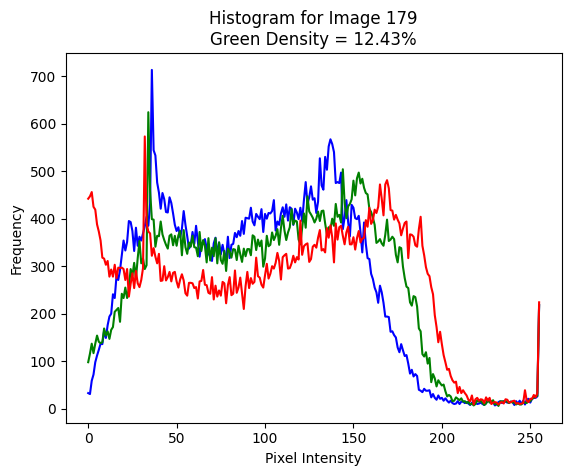


📌 Processing Image 180/209
🌿 Green Density: 10.46%


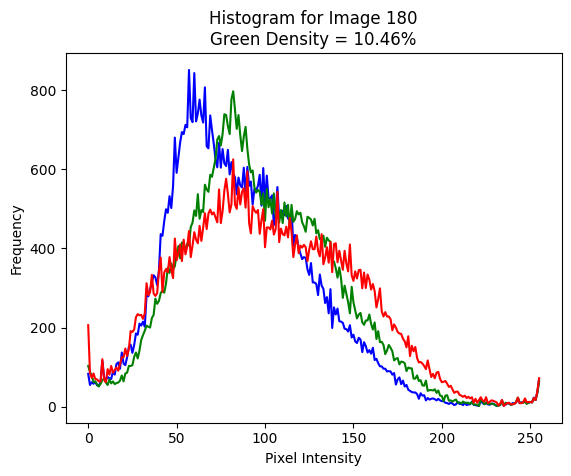


📌 Processing Image 181/209
🌿 Green Density: 9.45%


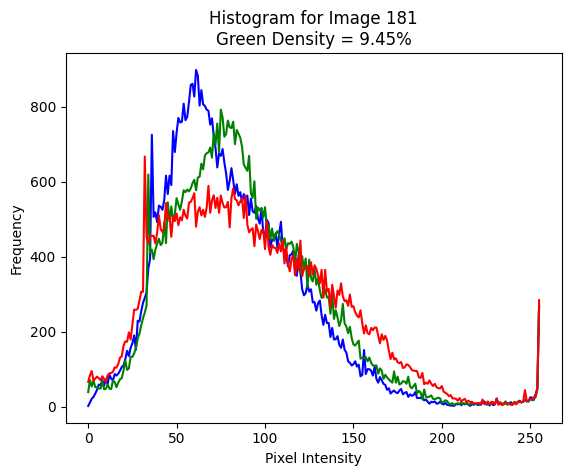


📌 Processing Image 182/209
🌿 Green Density: 21.62%


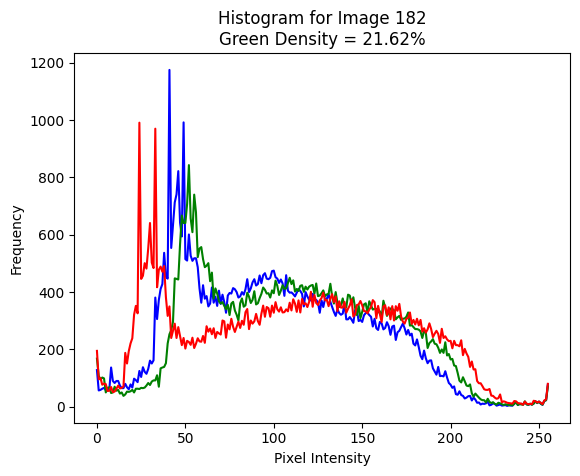


📌 Processing Image 183/209
🌿 Green Density: 14.98%


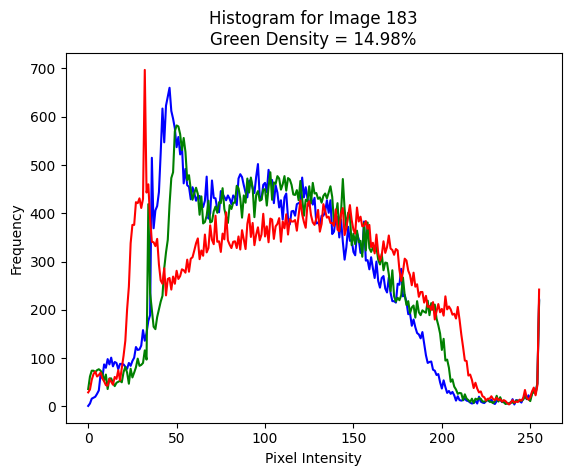


📌 Processing Image 184/209
🌿 Green Density: 0.89%


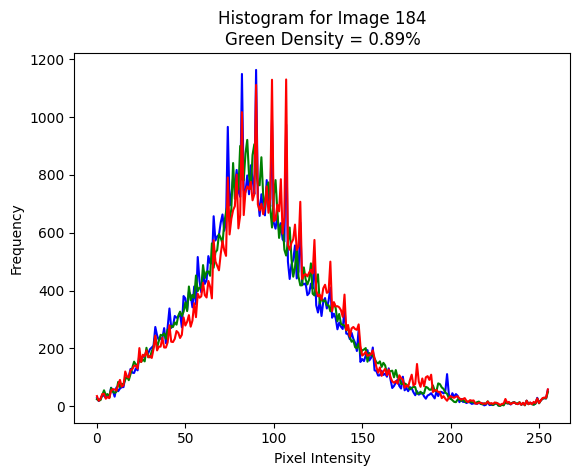


📌 Processing Image 185/209
🌿 Green Density: 0.75%


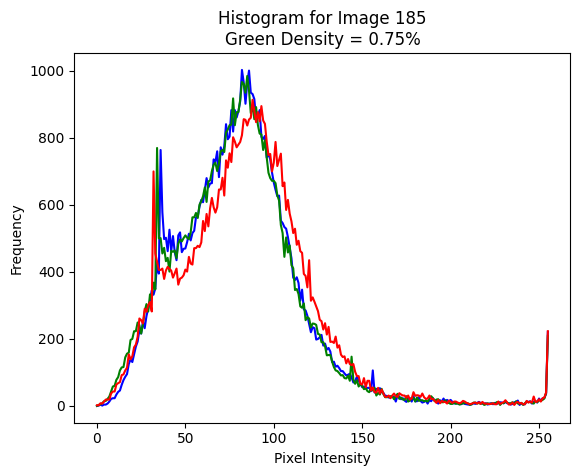


📌 Processing Image 186/209
🌿 Green Density: 1.63%


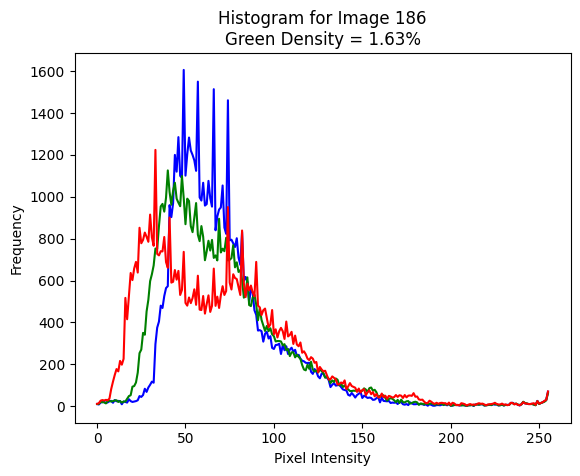


📌 Processing Image 187/209
🌿 Green Density: 0.10%


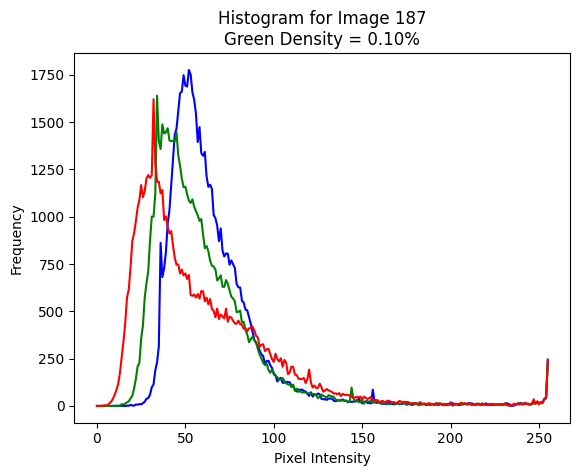


📌 Processing Image 188/209
🌿 Green Density: 1.52%


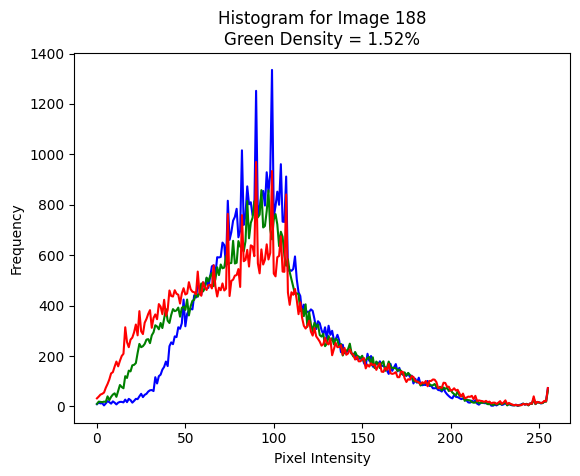


📌 Processing Image 189/209
🌿 Green Density: 0.22%


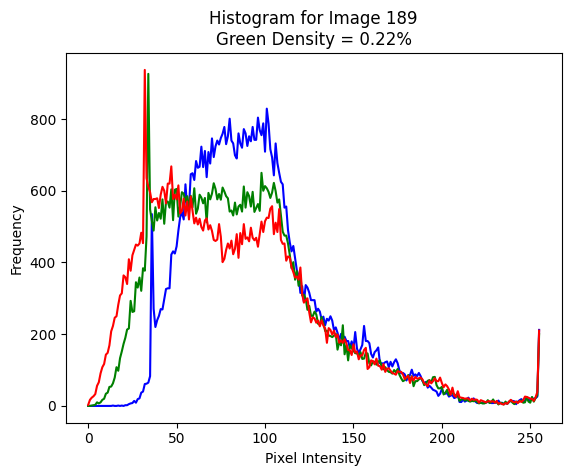


📌 Processing Image 190/209
🌿 Green Density: 13.73%


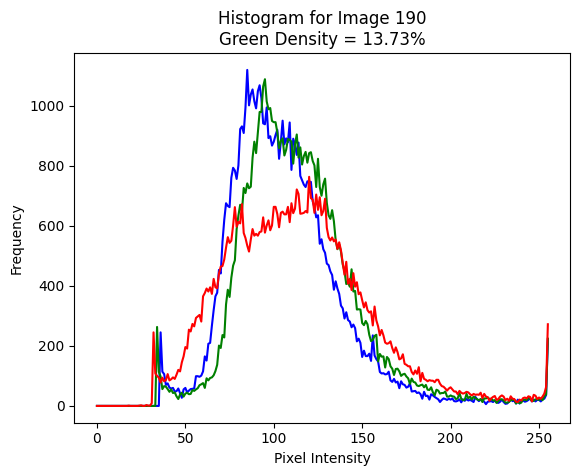


📌 Processing Image 191/209
🌿 Green Density: 8.78%


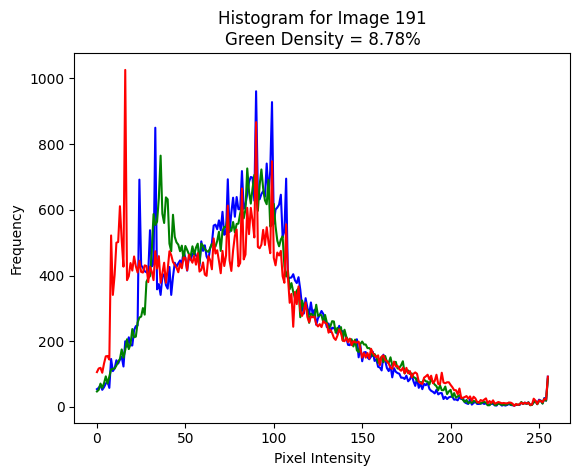


📌 Processing Image 192/209
🌿 Green Density: 8.67%


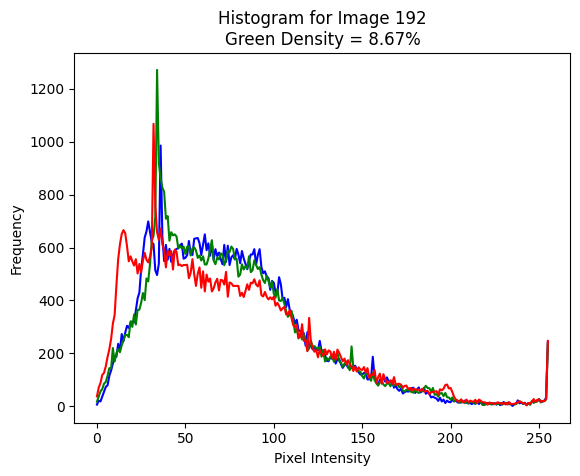


📌 Processing Image 193/209
🌿 Green Density: 20.11%


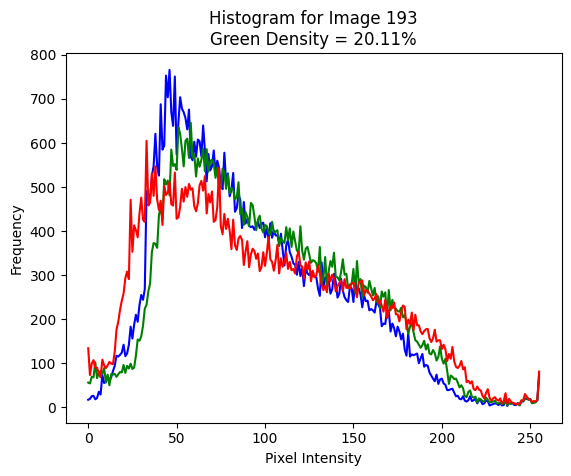


📌 Processing Image 194/209
🌿 Green Density: 14.36%


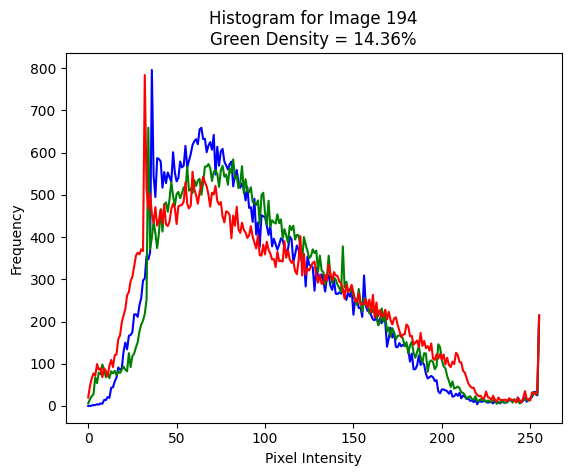


📌 Processing Image 195/209
🌿 Green Density: 2.50%


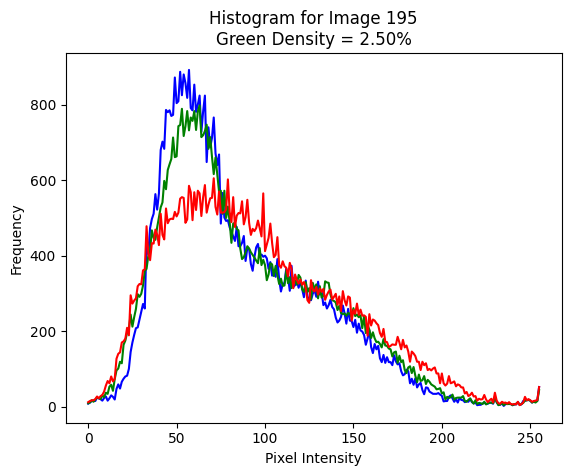


📌 Processing Image 196/209
🌿 Green Density: 1.79%


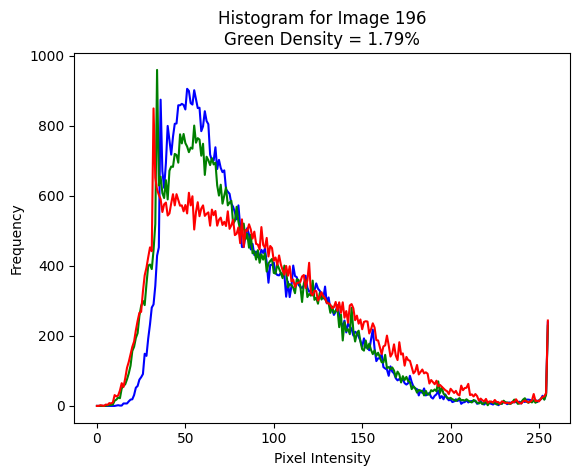


📌 Processing Image 197/209
🌿 Green Density: 2.59%


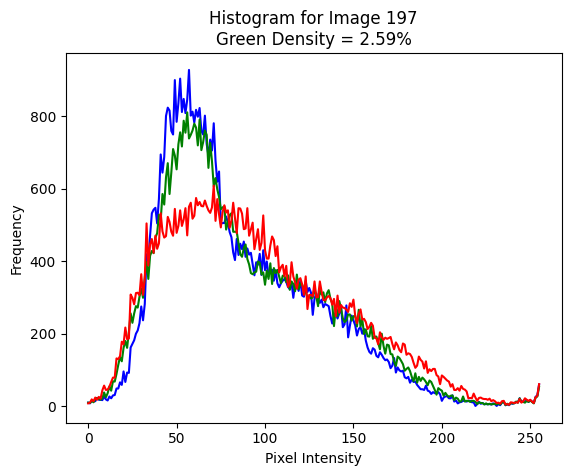


📌 Processing Image 198/209
🌿 Green Density: 1.85%


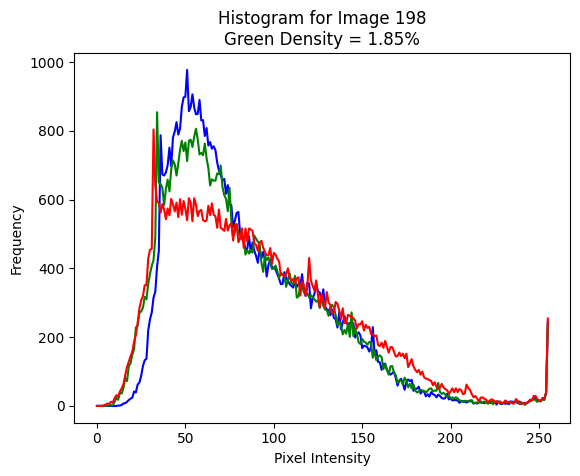


📌 Processing Image 199/209
🌿 Green Density: 0.15%


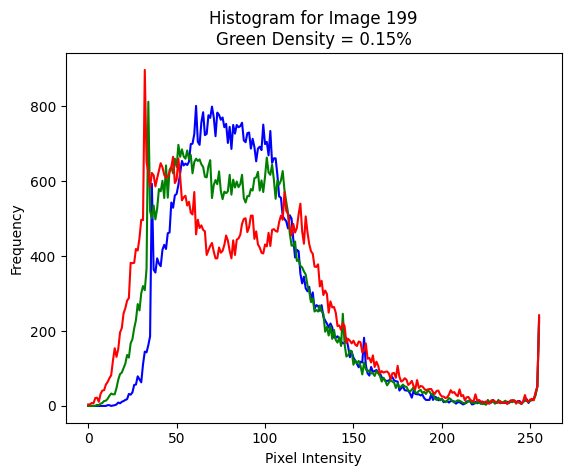


📌 Processing Image 200/209
🌿 Green Density: 0.15%


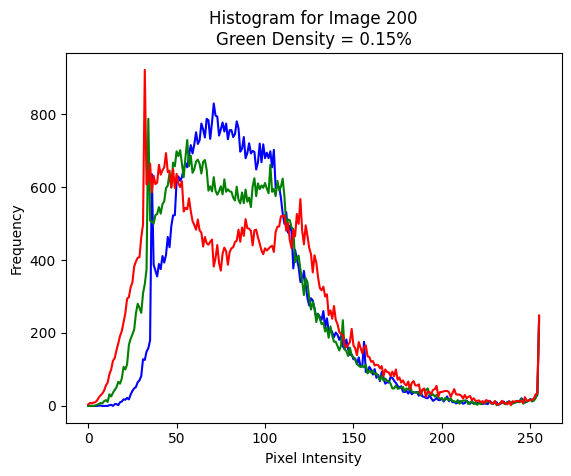


📌 Processing Image 201/209
🌿 Green Density: 1.67%


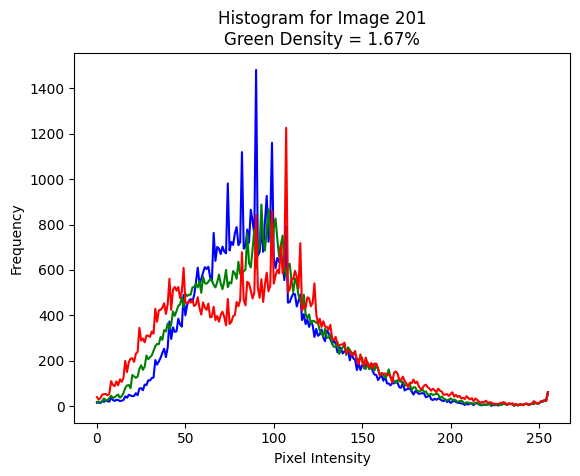


📌 Processing Image 202/209
🌿 Green Density: 6.38%


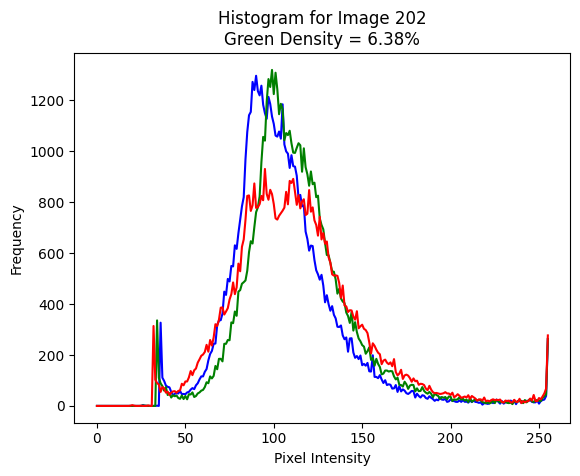


📌 Processing Image 203/209
🌿 Green Density: 17.75%


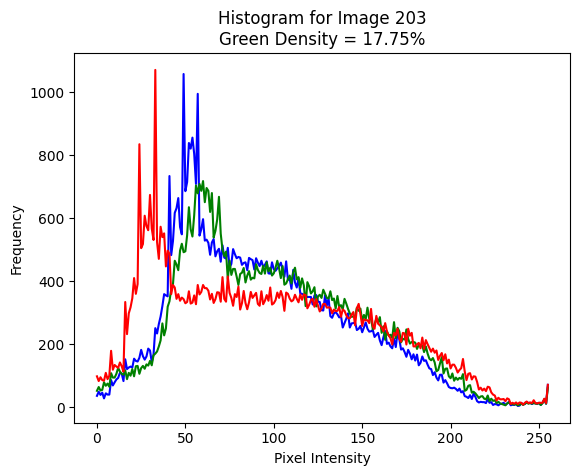


📌 Processing Image 204/209
🌿 Green Density: 11.47%


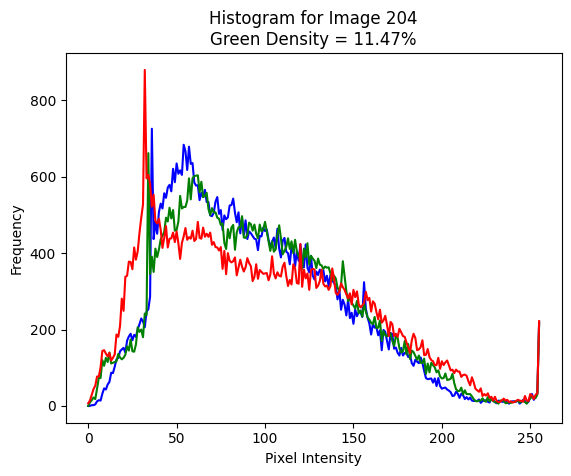


📌 Processing Image 205/209
🌿 Green Density: 10.17%


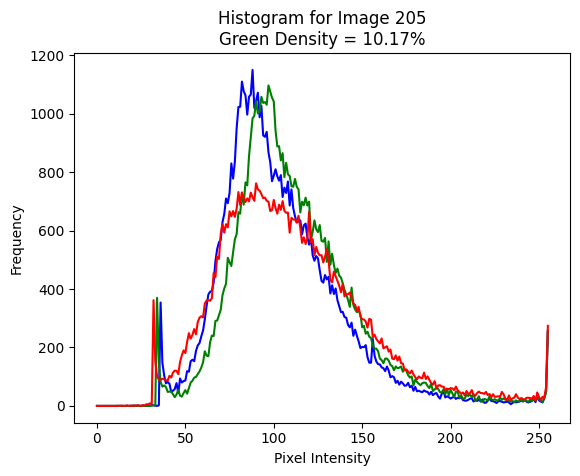


📌 Processing Image 206/209
🌿 Green Density: 17.81%


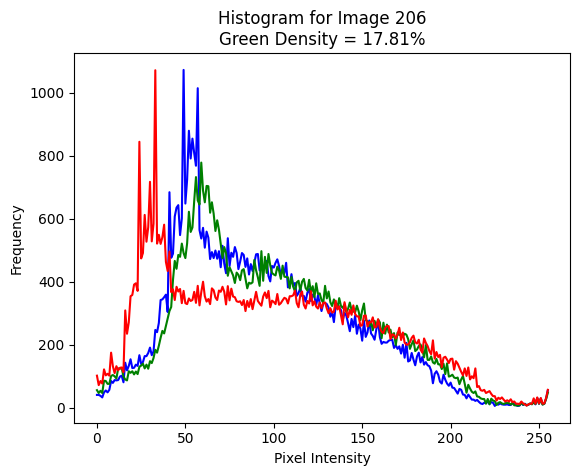


📌 Processing Image 207/209
🌿 Green Density: 11.24%


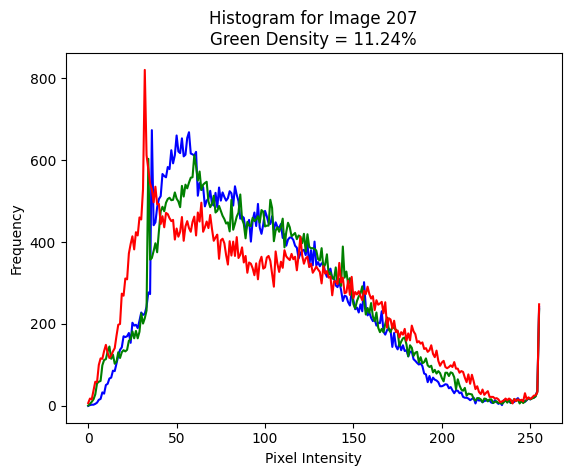


📌 Processing Image 208/209
🌿 Green Density: 18.14%


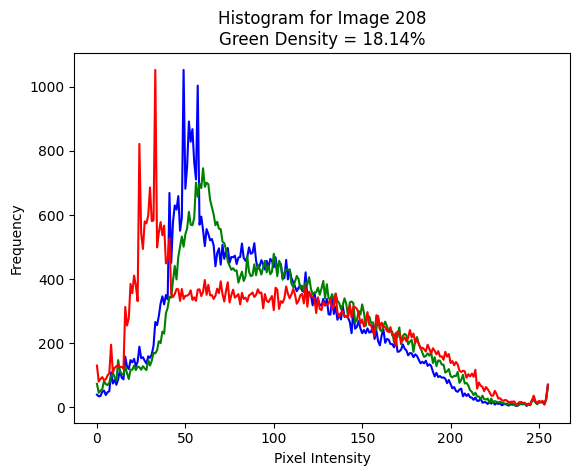


📌 Processing Image 209/209
🌿 Green Density: 11.48%


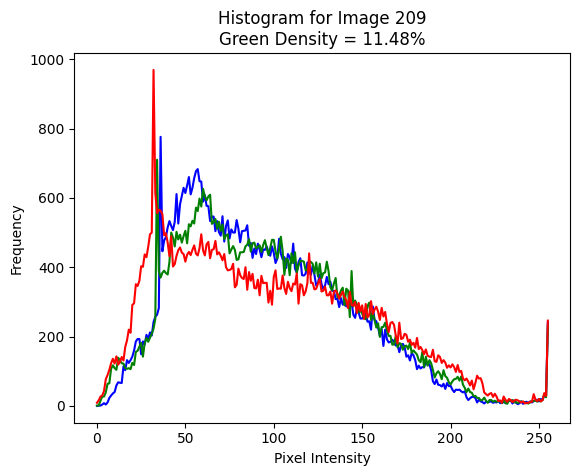


✅ Green density calculation complete! Added as new column in dataframe.


In [ ]:
import cv2
import matplotlib.pyplot as plt
import requests
import numpy as np
from io import BytesIO
from PIL import Image

# --- Convert Google Drive link to direct download ---
def gdrive_to_direct(url):
    if "drive.google.com" in url and "file/d/" in url:
        file_id = url.split("file/d/")[1].split("/")[0]
        return f"https://drive.google.com/uc?id={file_id}"
    return url

# --- Load image from GDrive link ---
def load_image_from_gdrive(url):
    try:
        response = requests.get(url, stream=True)
        response.raise_for_status()
        img = Image.open(BytesIO(response.content)).convert("RGB")
        return cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    except Exception as e:
        print(f"⚠️ Could not load {url} — {e}")
        return None

# --- Resize to standard size ---
def resize_image(img, size=(256, 256)):
    return cv2.resize(img, size)

# --- Normalize between 0–1 (not strictly needed for histogram) ---
def scale_image(img):
    return img / 255.0

# --- Calculate green vegetation density ---
def calculate_green_density(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    lower_green = np.array([35, 40, 40])
    upper_green = np.array([85, 255, 255])
    mask = cv2.inRange(hsv, lower_green, upper_green)

    green_pixels = cv2.countNonZero(mask)
    total_pixels = img.shape[0] * img.shape[1]
    return (green_pixels / total_pixels) * 100

# --- Plot histogram with density shown ---
def plot_histogram(img, green_density, title="Color Histogram"):
    color = ('b', 'g', 'r')
    plt.figure()
    for i, col in enumerate(color):
        hist = cv2.calcHist([img], [i], None, [256], [0, 256])
        plt.plot(hist, color=col)
    plt.title(f"{title}\nGreen Density = {green_density:.2f}%")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.show()

# --- Run for ALL images in dataset ---
green_densities = []  # to save values row-wise

for i, url in enumerate(df['IMAGES']):   # full dataset
    print(f"\n📌 Processing Image {i+1}/{len(df)}")

    direct_url = gdrive_to_direct(url)
    img = load_image_from_gdrive(direct_url)

    if img is not None:
        img_resized = resize_image(img)
        img_scaled = scale_image(img_resized)

        green_density = calculate_green_density(img_resized)
        green_densities.append(green_density)

        print(f"🌿 Green Density: {green_density:.2f}%")
        plot_histogram(img_resized, green_density, title=f"Histogram for Image {i+1}")

    else:
        green_densities.append(None)
        print(f"❌ Skipped Image {i+1}")

# --- Add results to DataFrame ---
df['Green_Density'] = green_densities
print("\n✅ Green density calculation complete! Added as new column in dataframe.")


In [ ]:
# Show first few rows
df.head(10)


,LOCATION,DATES,MIN . TEMPERATURE,MAX. TEMPERATURE,AVG. TEMPERATURE,AVG. Humidity(%),IMAGES,DIRECT_LINK,Vegetation_Density,Green_Density
0,GREATER NOIDA,1985-01-01,4,24,13.0,53,https://drive.google.com/file/d/1jUGrc4-_Wgvqt...,https://drive.google.com/uc?export=download&id...,None,19.570923
1,GREATER NOIDA,1985-12-31,7,21,14.0,70,https://drive.google.com/file/d/1bsHKaKW-PoUlm...,https://drive.google.com/uc?export=download&id...,None,13.426208
2,GREATER NOIDA,1986-12-31,7,21,14.0,70,https://drive.google.com/file/d/1FtouecyNNaPkz...,https://drive.google.com/uc?export=download&id...,None,15.357971
3,GREATER NOIDA,1987-12-31,7,21,14.0,70,https://drive.google.com/file/d/1a6FBmezSyws_d...,https://drive.google.com/uc?export=download&id...,None,15.345764
4,GREATER NOIDA,1988-12-31,7,21,14.0,70,https://drive.google.com/file/d/1HuRBz284q6sSl...,https://drive.google.com/uc?export=download&id...,None,15.382385
5,GREATER NOIDA,1989-12-31,7,21,14.0,70,https://drive.google.com/file/d/1xmcEEvDqMbVSa...,https://drive.google.com/uc?export=download&id...,None,15.653992
6,GREATER NOIDA,1990-12-31,7,21,14.0,70,https://drive.google.com/file/d/1CgzrIOR6JU8Cw...,https://drive.google.com/uc?export=download&id...,None,15.438843
7,GREATER NOIDA,1991-12-31,7,21,14.0,70,https://drive.google.com/file/d/1_1hHTUf7mGzzR...,https://drive.google.com/uc?export=download&id...,None,14.566040
8,GREATER NOIDA,1992-12-31,7,21,14.0,70,https://drive.google.com/file/d/1Ylu6f4tfgomfR...,https://drive.google.com/uc?export=download&id...,None,26.280212
9,GREATER NOIDA,1993-12-31,7,21,14.0,70,https://drive.google.com/file/d/1si4MQu8KHLoGW...,https://drive.google.com/uc?export=download&id...,None,22.175598


In [ ]:
# Save the dataset with the new column
df.to_csv("updated_dataset.csv", index=False)

# Download it to your computer
from google.colab import files
files.download("updated_dataset.csv")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>